<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/230706_DD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Concept drift tolerant machine learning method

In [1]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

# 실험을 위한 기본적인 function 들...

In [38]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
#from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

In [39]:
main_figsize=(15,3)

In [40]:
#  I(Z,B) > 0의 관계에 대해 z0를 전처리
class Sensitivity_Adapter(nn.Module):

    def __init__(self,input_dim):
        """Initializes DiscriminatorF with torch components."""

        super(Sensitivity_Adapter, self).__init__()

        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        #self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(2, self.input_dim*10))
            #self.fc2.append(nn.BatchNorm1d(num_features=50))
            self.fc3.append(nn.Linear(self.input_dim*10, 1))

        #self.fc = nn.Linear(input_dim, input_dim)

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            h0 = self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1))
            #h1 = F.relu(self.fc2[i](h0))
            #h2 = self.fc3[i](h1)
            h2 = self.fc3[i](F.relu(h0))
            pxy.append(h2)

        #return self.fc(torch.tensor(torch.cat(pxy, dim=1), requires_grad = True))
        return torch.cat(pxy, dim=1)


In [41]:
# Define the Generator
class Generator(nn.Module):
    """FR-Train generator (classifier).

    This class is for defining the structure of FR-Train generator (classifier).
    (ref: FR-Train paper, Section 3)

    Attributes:
        model: A model consisting of torch components.
    """

    def __init__(self, input_dim=5):
        """Initializes Generator with torch components."""
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, input_dim*4),
            nn.ReLU(),
            nn.Linear(input_dim*4, input_dim),
            nn.ReLU(),
            nn.Linear(input_dim, 1),
            nn.Sigmoid()
        )

    def forward(self, input_data):
        """Defines a forward operation of the model.

        Args:
            input_data: The input data.

        Returns:
            The predicted label (y_hat) for the given input data.
        """

        output = self.model(input_data)
        return output


In [42]:
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score

def test_model(model_,model2_, tX, ty, avaible_range,columns):
    model_.eval()

    b_dim = tX.shape[1]-1

    if model2_ == None:
        ax = tX[:,0:b_dim]
    else:
        model2_.eval()
        ax = model2_(tX[:,0:b_dim],tX[:,b_dim].reshape(-1,1)/avaible_range)

    y_hat = model_(ax)
    y_hat = (y_hat.cpu().data.numpy()> 0.5).astype(float)

    print('ty',ty.shape)
    print('y_hat',y_hat.shape)
    ty_ = ty.cpu().data.numpy()
    f1 = f1_score(ty_,y_hat)
    #################### MI #########################
    ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
    haf_size = int(ax_df.shape[0]/2)

    mi_scores = make_mi_scores(ax_df, y_hat, discrete_features="auto")
    sum_mi = np.sum(mi_scores)
    std_mi = np.std(mi_scores)

    mi_scores = make_mi_scores(ax_df[0:haf_size], y_hat[0:haf_size], discrete_features="auto")
    asum_mi = np.sum(mi_scores)
    astd_mi = np.std(mi_scores)

    mi_scores = make_mi_scores(ax_df[-haf_size:], y_hat[-haf_size:], discrete_features="auto")
    bsum_mi = np.sum(mi_scores)
    bstd_mi = np.std(mi_scores)

    print("Test f1 score: {}".format(f1))
    '''
    print("Sum of MI = {:.5f}".format(sum_mi))
    print("Std of MI = {:.5f}".format(std_mi))
    print("Sum of MI A = {:.5f}".format(asum_mi))
    print("Std of MI A = {:.5f}".format(astd_mi))
    print("Sum of MI B = {:.5f}".format(bsum_mi))
    print("Std of MI B = {:.5f}".format(bstd_mi))
    print("ABS(sum(A-B)) = {:.5f}".format(np.abs(asum_mi-bsum_mi)))
    print("ABS(std(A-B)) = {:.5f}".format(np.abs(astd_mi-bstd_mi)))
    '''
    return f1, (sum_mi,std_mi,asum_mi,astd_mi,bsum_mi,bstd_mi,np.abs(asum_mi-bsum_mi),np.abs(astd_mi-bstd_mi))

In [43]:

def test_all_data(generator,adapter,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = truncate_count + len(xl)

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        if adapter == None:
            xs = X_live_unit[:,0:b_dim]
        else:
            xs = adapter(X_live_unit[:,0:b_dim],X_live_unit[:,b_dim].reshape(-1,1)/avaible_range)
        predicted_y = generator(xs)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        cpu_xs = xs.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({train_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({train_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({train_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf

In [44]:
H=20

class Net(nn.Module):
    def __init__(self,input_dim):
        super(Net, self).__init__()
        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()
        #self.fc4 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(1, H))
            self.fc2.append(nn.Linear(1, H))
            self.fc3.append(nn.Linear(H, 1))

    def forward(self, x, y):
        h = []
        for i in range(self.input_dim):
            h0 = F.relu(self.fc1[i](x[:,i].reshape(-1,1))+self.fc2[i](y.reshape(-1,1)))
            h1 = self.fc3[i](h0)
            h.append(h1)

        return torch.cat(h, dim=1)

class customLoss(nn.Module):
    def __init__(self, model):
        super(customLoss, self).__init__()
        self.model = model

    def forward(self, x,y):
        minibatch = int(x.shape[0] * 0.8)
        s = np.random.choice(x.shape[0],minibatch)
        #x_sample = Variable(torch.from_numpy(x[s,:]).type(torch.FloatTensor), requires_grad = True)
        #y_sample = Variable(torch.from_numpy(y[s]).type(torch.FloatTensor), requires_grad = True)
        #y_shuffle = Variable(torch.from_numpy(np.random.permutation(y[s])).type(torch.FloatTensor), requires_grad = True)
        x_sample = x[s,:] #Variable(x[s,:], requires_grad = True)
        y_sample = y[s] #Variable(, requires_grad = True)
        y_shuffle = y[torch.randperm(minibatch)] #Variable(, requires_grad = True)
        p_xy = self.model(x_sample, y_sample)
        p_x_y = self.model(x_sample, y_shuffle)
        ret = torch.mean(p_xy,0) - torch.log(torch.mean(torch.exp(p_x_y),0))
        loss = - ret
        return loss

In [45]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, avaible_range, alpha, columns,ShowChart = False, do_mine=True):
    seed_everything()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)

    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train.to(device)
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test.to(device)
    #s1_test = test_tensors.s1_test.to(device)

    # Saves return values here
    #test_result = []

    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch

    b_dim = XS_train.shape[1]-1

    # The loss values of each component will be saved in the following lists.
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    a_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss(reduce=False)  # mean square error

    # Initializes generator and discriminator
    generator = Generator(b_dim).to(device)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]


    adapter = Sensitivity_Adapter(b_dim).to(device)
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net(b_dim).to(device)
    optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.01)
    loss_mse = customLoss(mine)

    kld_loss = nn.KLDivLoss(reduction='batchmean')

    for epoch in tqdm(range(n_epochs)):


        # -------------------------------
        #  b에 대한 x의 전처리
        # -------------------------------

        if lambda_f >= 0.0:
            xs = adapter(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range) # z0, b

            #org = torch.histc(XS_train[:,0:b_dim], bins=100, min=0, max=1)
            #trg = torch.histc(xs, bins=100, min=0, max=1)

            ml = torch.mean(mse_loss(xs, XS_train[:,0:b_dim]),dim=0)

            ## distribution의 변차를 최소화 한다. kld_loss ??
            #kl = torch.mean(kld_loss(trg.log(), org),dim=0)
            #
            a_loss =  torch.sum(ml) + torch.std(ml)
        else:
            xs = XS_train[:,0:b_dim]
            a_loss = torch.tensor(0.0)

        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        '''
        if do_mine and lambda_f >= 0.0:
            # -------------------
            #  Forwards MINE
            # -------------------
            # MI(x_t,y_t) < MI (x_t+1,y_t+1) 이되도록 학습한다.
            s = np.random.choice(range(500,train_len-500))
            mine_loss = loss_mse(xs[s-500:s],y_train[s-500:s]) - loss_mse(xs[s:s+500],y_train[s:s+500])
            #print(mine_loss.mean())
        else:
            mine_loss = torch.tensor(0.0)
        '''
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) #+ torch.log(mine_loss.mean()+1)*0.001

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        if lambda_f >= 0.0:
            loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha #* 0.05
        else:
            loss = g_loss

        loss.backward()
        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()

        a_losses.append(a_loss.cpu().data.numpy())
        g_losses.append(g_loss.cpu().data.numpy())

        '''
        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [a loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, a_losses[-1], g_losses[-1])
                )
        '''
        if lambda_f < 0.0:
            adapter = None

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1,mi = test_model(generator,adapter, XS_test, y_test, avaible_range,columns)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    df_loss = pd.DataFrame({'Adapter loss':a_losses,'Classifier loss':g_losses})
    if ShowChart:
        df_loss.plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel=f'bucket ({XS_train.shape[0]})',fontsize=15)
        plt.legend(loc=1)
        plt.show()
    '''
    plt.figure(figsize=main_figsize)
    plt.plot(a_losses,linewidth=1,label='Adapter loss')
    plt.plot(g_losses,linewidth=1,label='classifier loss')
    plt.ylabel('loss')
    plt.xlabel(f'bucket ({bucket_size})')
    plt.legend(loc=1,ncol=2)
    plt.show()
    '''
    return f1,mi,generator,adapter,df_loss

In [46]:
plt.style.use('bmh')

def __ks_2samp2(sample1, sample2):
    # Gets all observations
    sample1 = np.sort(sample1)
    sample2 = np.sort(sample2)
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]
    data_all = np.concatenate([sample1, sample2])
    cdf1 = np.searchsorted(sample1, data_all, side='right') / n1
    cdf2 = np.searchsorted(sample2, data_all, side='right') / n2
    # Evaluates the KS statistic
    cddiffs = cdf1 - cdf2
    minS = -np.min(cddiffs)
    maxS = np.max(cddiffs)
    ks_stat =  max(minS, maxS)

    #if ks_stat == minS:
    #    ks_stat = -ks_stat

    # Calculates the P-Value based on the two-sided test
    # The P-Value comes from the KS Distribution Survival Function (SF = 1-CDF)
    m, n = float(n1), float(n2)
    en = m * n / (m + n)
    p_value = 0.0 #stats.kstwobign.sf(math.sqrt(en) * abs(ks_stat))
    #p_value = stats.kstwobign.sf(en * abs(ks_stat))
    return ks_stat,p_value

def __ks_drift(ref_x,inf_x):
    x_drift = np.zeros((ref_x.shape[1],2))
    for i in range(ref_x.shape[1]):
        #s, p = ks_2samp(ref_x[:,i],inf_x[:,i],mode='asymp')
        s, p = __ks_2samp2(ref_x[:,i],inf_x[:,i])
        x_drift[i,0] = s
        x_drift[i,1] = p
    return x_drift

In [47]:
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

In [48]:
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int):

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    columns = X.columns
    scaler_c1 = MinMaxScaler()
    # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
    X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = truncate_count + len(xl)

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    plt.figure(figsize=main_figsize)
    plt.plot(df_mis.values,linewidth=1,label=columns)
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({train_size})')
    #df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf.values,linewidth=1,label=columns)
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({train_size})')
    #df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    return X,Y

In [49]:
import copy
import torch.optim as optim

def train_classificaion_model(X,Y,train_size, test_size):
    seed_everything()

    mi_scores = make_mi_scores(X[test_size:test_size+train_size], Y[test_size:test_size+train_size], discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)
    # Convert to 2D PyTorch tensors
    X_train = torch.tensor(X[:train_size].values, dtype=torch.float32).to(device)
    y_train = torch.tensor(Y[:train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    X_test = torch.tensor(X[test_size:test_size+train_size].values, dtype=torch.float32).to(device)
    y_test = torch.tensor(Y[test_size:test_size+train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    in_dim = X_train.shape[1]
    # Define the model
    model = nn.Sequential(
        nn.Linear(in_dim, in_dim*4),
        nn.ReLU(),
        nn.Linear(in_dim*4, in_dim),
        nn.ReLU(),
        nn.Linear(in_dim, 1),
        nn.Sigmoid()
    ).to(device)

    # loss function and optimizer
    loss_fn = nn.BCELoss()  # mean square error
    optimizer = optim.Adam(model.parameters(), lr=0.0001)

    n_epochs = 1000   # number of epochs to run
    batch_size = 100  # size of each batch
    batch_start = torch.arange(0, len(X_train), batch_size)

    # Hold the best model
    best_mse = np.inf   # init to infinity
    best_weights = None
    history = []

    for epoch in tqdm(range(n_epochs)):
        model.train()
        with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
            bar.set_description(f"Epoch {epoch}")
            for start in bar:
                # take a batch
                X_batch = X_train[start:start+batch_size]
                y_batch = y_train[start:start+batch_size]
                # forward pass
                y_pred = model(X_batch)
                loss = loss_fn(y_pred, y_batch)
                # backward pass
                optimizer.zero_grad()
                loss.backward()
                # update weights
                optimizer.step()
                # print progress
                bar.set_postfix(mse=float(loss))
        # evaluate accuracy at end of each epoch
        model.eval()
        y_pred = model(X_test)
        mse = loss_fn(y_pred, y_test)
        mse = float(mse)
        history.append(mse)
        if mse < best_mse:
            best_mse = mse
            best_weights = copy.deepcopy(model.state_dict())

    # restore model and return best accuracy
    model.load_state_dict(best_weights)
    print("MSE: %.2f" % best_mse)
    print("RMSE: %.2f" % np.sqrt(best_mse))
    plt.plot(history)
    plt.show()

    from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
    predicted_y = model(X_test)
    f1_ = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
    print(f'F1 Score:{f1_:.5f}')

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = truncate_count + len(xl)

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set), dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []

    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        predicted_y = model(X_live_unit)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        f1s.append(f1_)

    plt.figure(figsize=main_figsize)
    plt.plot(f1s,linewidth=1)
    plt.ylabel('F1 score')
    plt.xlabel(f'bucket ({train_size})')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

    result_table3 = {}
    #result_table3['lambda']=[]
    result_table3['test_f1']=[]
    result_table3['init_f1']=[]
    result_table3['mean_f1']=[]
    result_table3['last_f1']=[]
    result_table3['SUM(MI)']=[]

    #result_table3['lambda'].append('Case #1 Feature 5')
    result_table3['test_f1'].append(f1_)
    result_table3['init_f1'].append(f1s[0])
    result_table3['mean_f1'].append(np.mean(f1s))
    result_table3['last_f1'].append(f1s[-1])
    result_table3['SUM(MI)'].append(np.sum(mi_scores))

    result = pd.DataFrame(result_table3)
    print(result)
    return model, result

In [50]:
def drift_tolerant(X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0):

    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
    lambda_f_set = [-0.1,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
    #lambda_f_set = [-0.1,0.0,0.5,0.9] #[-0.1,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9] #[-0.1,0.0,0.5] #
    lambda_a2 = 0.0

    print('lambda_f2',lambda_f2)
    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['sum mi']=[]
    result_table2['std mi']=[]
    result_table2['sum * std']=[]
    result_table2['sum 1/2']=[]
    result_table2['std 1/2']=[]
    result_table2['sum 2/2']=[]
    result_table2['std 2/2']=[]
    result_table2['sum 1-2']=[]
    result_table2['std 1-2']=[]
    result_table2['sum 1+2']=[]
    result_table2['std 1+2']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        print(f'######################### Lambda {lambda_f} ###########################')
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns)# 0.00057)
        tad,df_mis,df_drf = test_all_data(last_generator,last_adapter,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #1, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['sum mi'].append(mi[0])
        result_table2['std mi'].append(mi[1])
        result_table2['sum * std'].append(mi[0]*mi[1])
        result_table2['sum 1/2'].append(mi[2])
        result_table2['std 1/2'].append(mi[3])
        result_table2['sum 2/2'].append(mi[4])
        result_table2['std 2/2'].append(mi[5])
        result_table2['sum 1-2'].append(mi[6])
        result_table2['std 1-2'].append(mi[7])
        result_table2['sum 1+2'].append(mi[2]+mi[4])
        result_table2['std 1+2'].append(mi[3]+mi[5])

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df[1:]['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    best_lambda = result4_df[result4_df['sum * std']== np.min(result4_df[1:]['sum * std'])]['lambda']
    result_df[['Normal model',f'λ_{best_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    return result4_df

# 실험
+ synthetic data를 만든다.
+ 해당 data는 data drift가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다.

## synthetic data의 생성 (Case #1 MI의 감소, Drift의 증가 )



+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift

### Dataset 준비

In [51]:
data_size = 40000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [52]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    #sns.scatterplot(x=x[:,ix],y=y)

In [53]:
seed_everything(100)

for i in range(400):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
#sns.scatterplot(x=x[0:200,4],y=y[0:200])
#sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

### 실험

MI Analysis MI Max 0.20278, Min 0.02707, Mean 0.09885, Std 0.06305
Dataset structure X_train, (1800, 5) X_test, (1800, 5) X_live (39800, 5)
Truncate 7200 rows from live_set (39800, 5)
Search MI & Drift...for X_live_set (191, 1800, 5)


100%|██████████| 191/191 [00:07<00:00, 24.04it/s]


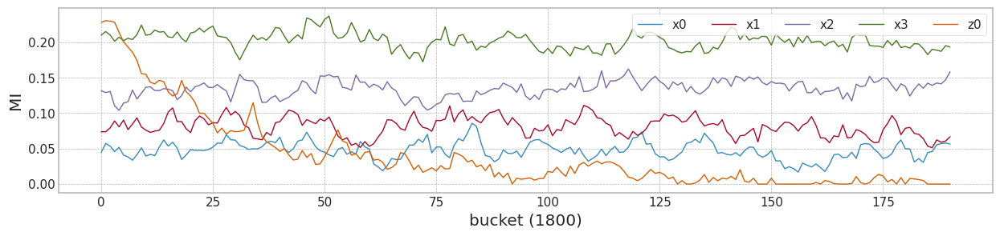

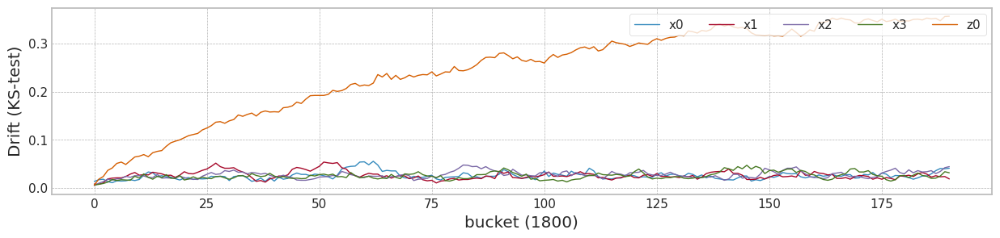

MI Analysis MI Max 0.22806, Min 0.04445, Mean 0.13760, Std 0.07241
cuda:0


100%|██████████| 1000/1000 [00:26<00:00, 37.67it/s]


MSE: 0.23
RMSE: 0.48


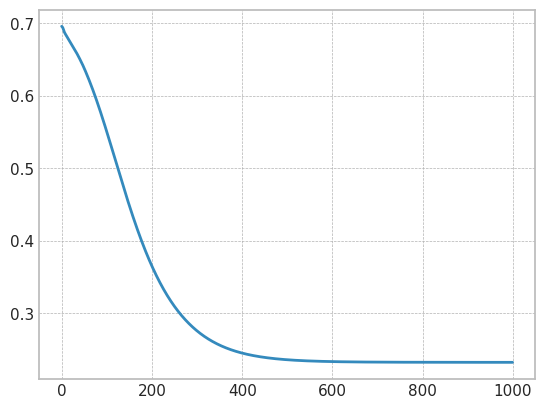

F1 Score:0.90291
Dataset structure X_train, torch.Size([1800, 5]) X_test, torch.Size([1800, 5]) X_live (39800, 5)
Truncate 7200 rows from live_set (39800, 5)


100%|██████████| 191/191 [00:00<00:00, 397.53it/s]


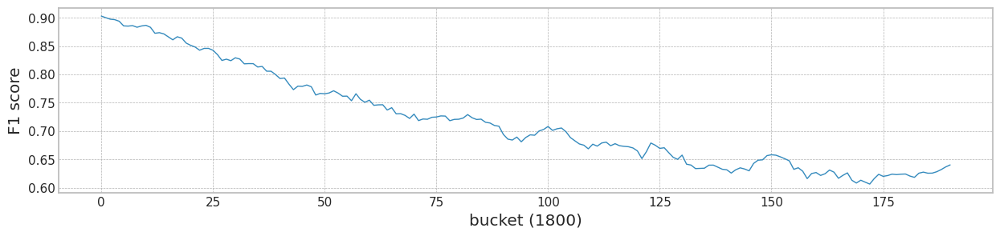

    test_f1   init_f1   mean_f1   last_f1   SUM(MI)
0  0.640502  0.902907  0.717763  0.640502  0.688003


In [54]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
Y = y

train_size = 1800
test_size = 200

X1,Y1 = check_mi_drift(X, Y,train_size, test_size)
model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [55]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
mine = Net(X1.shape[1]).to(device)
optimizer = torch.optim.Adam(mine.parameters(), lr=0.01)
loss_mse = customLoss(mine)
plot_loss = []

x = torch.tensor(X1.values,dtype=torch.float32).to(device)
y = torch.tensor(Y1,dtype=torch.float32).to(device)

for epoch in tqdm(range(300)):
    mine.zero_grad()
    mine_loss = loss_mse(x,y)
    mine_loss.mean().backward()
    optimizer.step()
    plot_loss.append(-mine_loss.cpu().data.numpy())


plot_loss = np.asarray(plot_loss)
df_loss = pd.DataFrame(plot_loss,columns=X1.columns)

cuda:0


100%|██████████| 300/300 [00:02<00:00, 118.10it/s]


<Axes: >

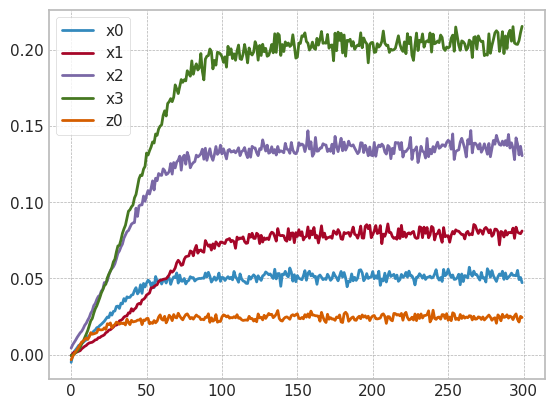

In [56]:
df_loss.plot()

In [57]:
X1['b'] = [int(b) for b in X1.index.values/700]
X1

,x0,x1,x2,x3,z0,b
0,0.511187,0.348595,0.564807,0.482506,0.395084,0
1,0.435937,0.524656,0.595436,0.762536,0.606272,0
2,0.479071,0.682932,0.738867,0.596141,0.688060,0
3,0.572894,0.251745,0.392850,0.522275,0.344350,0
4,0.562890,0.613393,0.481594,0.596584,0.670729,0
...,...,...,...,...,...,...
39995,0.332800,0.214564,0.468946,0.614324,-0.069684,57
39996,0.414601,0.252607,0.438192,0.601093,0.984518,57
39997,0.361400,0.558191,0.590386,0.612855,0.528420,57
39998,0.459619,0.212723,0.148134,0.664097,2.043499,57


lambda_f2 1.0
######################### Lambda -0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.85it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9026258205689278
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.36it/s]


mean of drift:
x0    0.025457
x1    0.026437
x2    0.027571
x3    0.025285
z0    0.245739
dtype: float64
Mean F1 for all data: 0.7111527621222895
######################### Lambda 0.0 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 223.36it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9060955518945635
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.74it/s]


mean of drift:
x0    1.000000
x1    0.999846
x2    1.000000
x3    1.000000
z0    0.995870
dtype: float64
Mean F1 for all data: 0.7510667013886474
######################### Lambda 0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 218.39it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9035812672176309
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.76it/s]


mean of drift:
x0    0.908831
x1    0.457807
x2    0.830398
x3    0.541920
z0    0.222592
dtype: float64
Mean F1 for all data: 0.17859184274802914
######################### Lambda 0.2 ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 220.59it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9001097694840835
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.93it/s]


mean of drift:
x0    0.495762
x1    0.178851
x2    0.773124
x3    0.275939
z0    0.322234
dtype: float64
Mean F1 for all data: 0.7977221125768242
######################### Lambda 0.3 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 222.33it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9063013698630137
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.71it/s]


mean of drift:
x0    0.325756
x1    0.286434
x2    0.635241
x3    0.303360
z0    0.374302
dtype: float64
Mean F1 for all data: 0.7829744418864497
######################### Lambda 0.4 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 223.60it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.8969298245614036
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.05it/s]


mean of drift:
x0    0.106460
x1    0.212379
x2    0.290195
x3    0.197967
z0    0.253834
dtype: float64
Mean F1 for all data: 0.8071077346300006
######################### Lambda 0.5 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.97it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9037932930181418
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.26it/s]


mean of drift:
x0    0.193935
x1    0.307888
x2    0.347437
x3    0.180055
z0    0.288240
dtype: float64
Mean F1 for all data: 0.7882415919443082
######################### Lambda 0.6 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.14it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9045005488474205
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.18it/s]


mean of drift:
x0    0.262077
x1    0.235864
x2    0.172679
x3    0.174136
z0    0.169974
dtype: float64
Mean F1 for all data: 0.7930617798907139
######################### Lambda 0.7 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.15it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9038251366120219
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.23it/s]


mean of drift:
x0    0.251466
x1    0.211620
x2    0.196329
x3    0.168022
z0    0.124846
dtype: float64
Mean F1 for all data: 0.7983255363462843
######################### Lambda 0.8 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.76it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9044238121245222
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.29it/s]


mean of drift:
x0    0.140311
x1    0.172938
x2    0.123493
x3    0.067664
z0    0.173540
dtype: float64
Mean F1 for all data: 0.7848147718862012
######################### Lambda 0.9 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.19it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9051254089422028
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.19it/s]


mean of drift:
x0    0.046478
x1    0.122717
x2    0.102946
x3    0.079872
z0    0.215253
dtype: float64
Mean F1 for all data: 0.7577926437388611


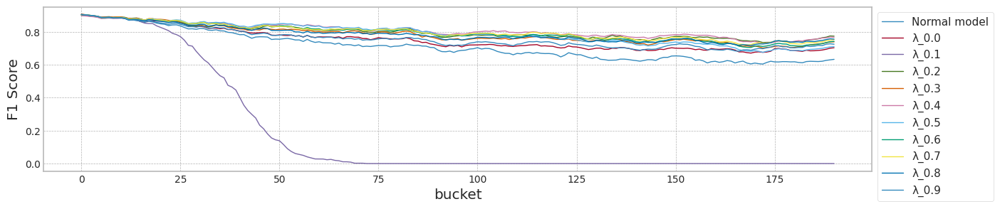

max_mean_lambda= 0.4


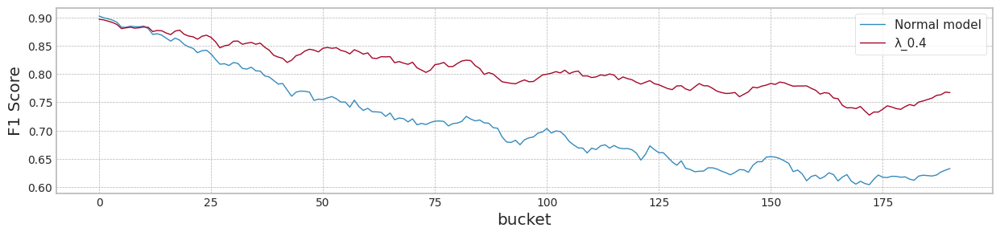

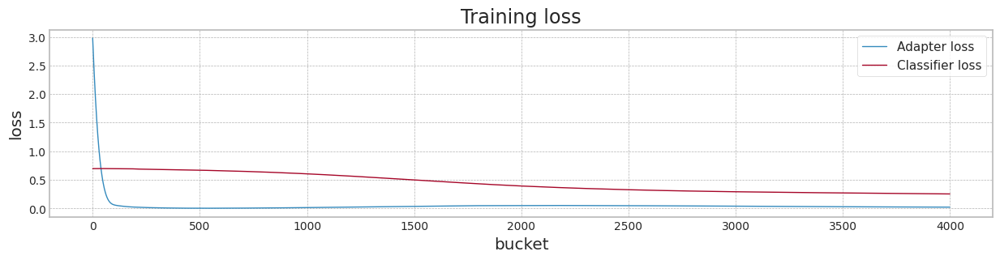

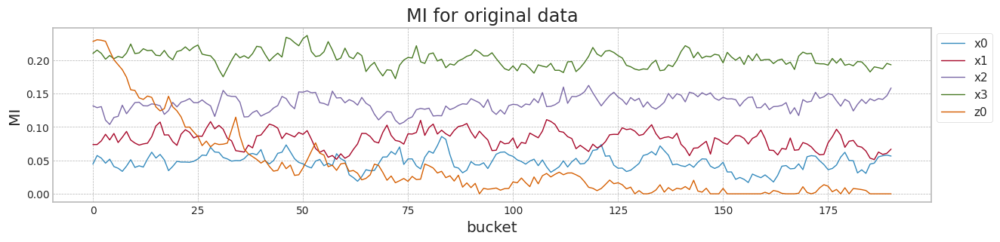

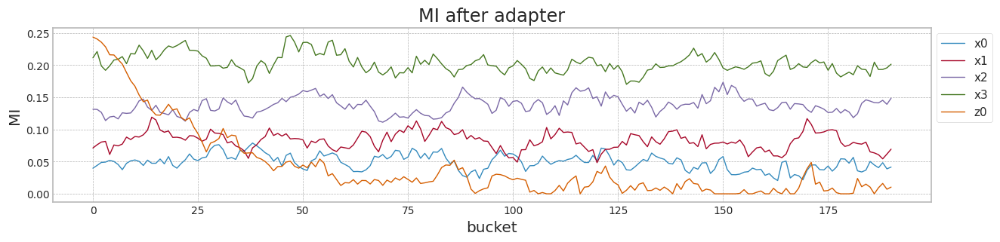

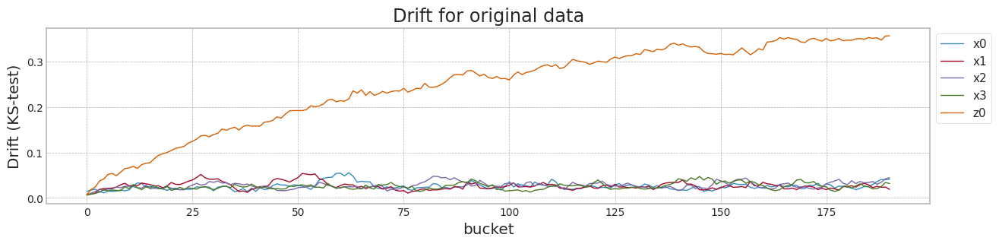

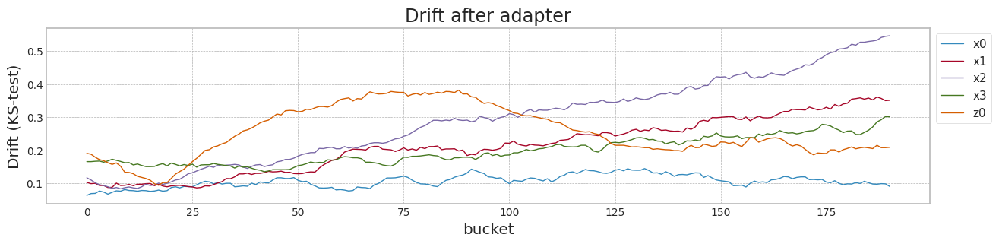

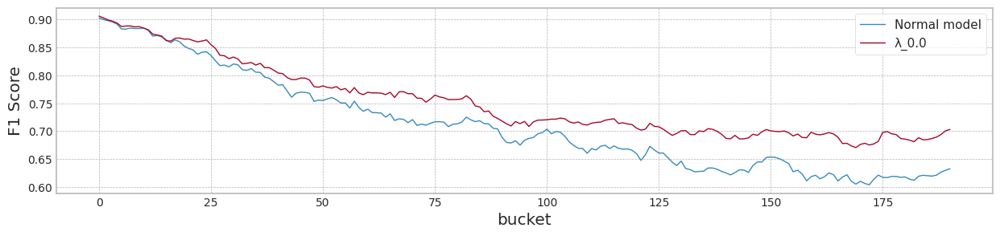

,lambda,test_f1,init_f1,mean_f1,last_f1,sum mi,std mi,sum * std,sum 1/2,std 1/2,sum 2/2,std 2/2,sum 1-2,std 1-2,sum 1+2,std 1+2
0,"Case #1, Normal model",0.902626,0.902626,0.711153,0.632739,0.784381,0.095664,0.075037,0.868745,0.118800,0.757712,0.088996,0.111032,0.029804,1.626457,0.207796
1,0.0,0.906096,0.906096,0.751067,0.703138,0.798052,0.091061,0.072671,0.874456,0.097096,0.770700,0.087500,0.103756,0.009596,1.645156,0.184596
2,0.1,0.903581,0.903581,0.178592,0.000000,0.817061,0.092349,0.075455,0.882247,0.110995,0.762481,0.089209,0.119766,0.021786,1.644728,0.200205
3,0.2,0.900110,0.900110,0.797722,0.773438,0.793754,0.102364,0.081252,0.865260,0.125972,0.729897,0.097894,0.135363,0.028078,1.595156,0.223867
4,0.3,0.906301,0.906301,0.782974,0.738962,0.836541,0.090471,0.075683,0.895944,0.114722,0.772379,0.086939,0.123565,0.027783,1.668323,0.201661
5,0.4,0.896930,0.896930,0.807108,0.767112,0.807526,0.109457,0.088389,0.885663,0.133295,0.759851,0.093282,0.125813,0.040012,1.645514,0.226577
6,0.5,0.903793,0.903793,0.788242,0.710011,0.831855,0.094248,0.078401,0.913329,0.122804,0.780301,0.087355,0.133028,0.035448,1.693629,0.210159
7,0.6,0.904501,0.904501,0.793062,0.741872,0.834706,0.098213,0.081979,0.912340,0.120098,0.783331,0.086927,0.129010,0.033171,1.695671,0.207025
8,0.7,0.903825,0.903825,0.798326,0.752791,0.826710,0.095524,0.078971,0.884119,0.117698,0.753029,0.087904,0.131090,0.029794,1.637148,0.205602
9,0.8,0.904424,0.904424,0.784815,0.755342,0.846648,0.094505,0.080013,0.873183,0.118935,0.775832,0.091508,0.097351,0.027427,1.649014,0.210443


In [58]:
drift_tolerant(X1, Y1,train_size, test_size,avaible_range = np.max(X1['b']+1))

## synthetic data의 생성 (Case #2 MI의 증감(상대적), Drift의 고정)

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature에 대해 y의 비중이 시간에 따라 감소하도록 생성

### Dataset 준비

In [59]:
data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 2.5])

In [60]:
seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

In [61]:
x1.shape

(40000, 5)

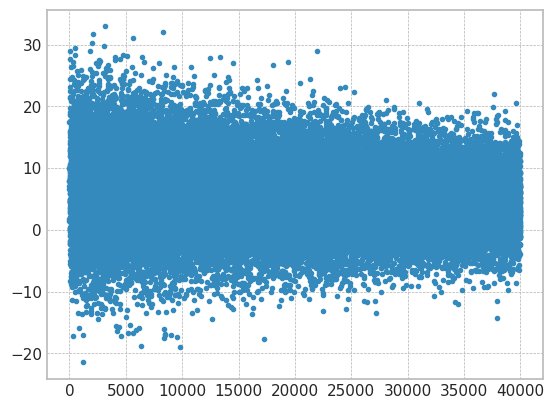

In [62]:
import matplotlib.pyplot as plt

seed_everything()

y1_array = []
cor_const = cor[4]
for ii in range(x1.shape[0]):
    cor[4] = cor[4] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    y1_array.append(np.sum(cor * x1[ii])+e)

plt.plot(y1_array,'.')

In [63]:
m = 5 #np.mean(y1_array[0:2000])
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
print(sum(y1))

5
21325


### 실험

MI Analysis MI Max 0.22746, Min 0.00677, Mean 0.06988, Std 0.08433
Dataset structure X_train, (1800, 5) X_test, (1800, 5) X_live (39800, 5)
Truncate 7200 rows from live_set (39800, 5)
Search MI & Drift...for X_live_set (191, 1800, 5)


100%|██████████| 191/191 [00:08<00:00, 23.62it/s]


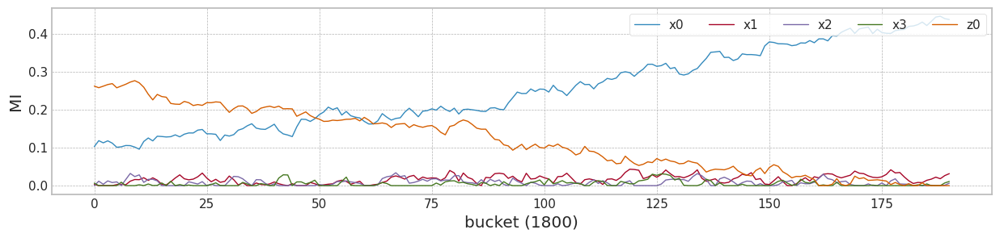

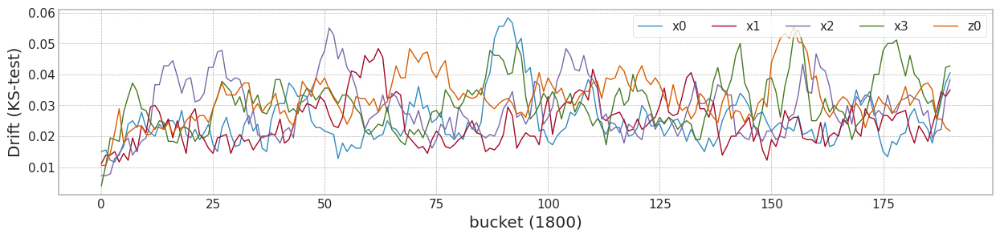

MI Analysis MI Max 0.26184, Min 0.00000, Mean 0.07488, Std 0.10109
cuda:0


100%|██████████| 1000/1000 [00:26<00:00, 37.94it/s]


MSE: 0.05
RMSE: 0.23


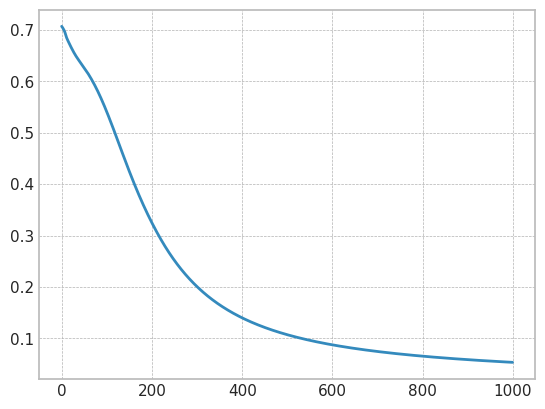

F1 Score:0.99568
Dataset structure X_train, torch.Size([1800, 5]) X_test, torch.Size([1800, 5]) X_live (39800, 5)
Truncate 7200 rows from live_set (39800, 5)


100%|██████████| 191/191 [00:00<00:00, 414.14it/s]


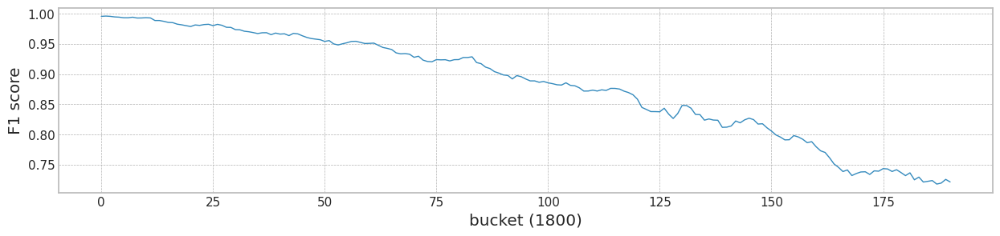

    test_f1   init_f1   mean_f1   last_f1   SUM(MI)
0  0.721577  0.995679  0.882188  0.721577  0.374413


In [64]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 1800
test_size = 200

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)
model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [65]:
X1['b'] = [int(b/700) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.519751,0.468030,0.270011,0.516605,0.339159,0
1,0.605565,0.386136,0.467312,0.549700,0.666164,0
2,0.551222,0.433079,0.644682,0.704678,0.471856,0
3,0.335978,0.625620,0.283118,0.494381,0.609888,0
4,0.496805,0.524298,0.566753,0.426693,0.472373,0
...,...,...,...,...,...,...
39995,0.325122,0.364328,0.241452,0.576603,0.717378,57
39996,0.350268,0.453351,0.284085,0.543373,0.701927,57
39997,0.553850,0.305018,0.504892,0.544244,0.491374,57
39998,0.426469,0.502344,0.239389,0.229965,0.775500,57


lambda_f2 1.0
######################### Lambda -0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 648.29it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9721040189125295
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.53it/s]


mean of drift:
x0    0.024977
x1    0.024340
x2    0.029145
x3    0.030794
z0    0.032225
dtype: float64
Mean F1 for all data: 0.8643210537736058
######################### Lambda 0.0 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.85it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9975996159385503
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.83it/s]


mean of drift:
x0    0.993933
x1    0.818761
x2    1.000000
x3    1.000000
z0    0.786498
dtype: float64
Mean F1 for all data: 0.8901865345297906
######################### Lambda 0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.66it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9856733524355301
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.18it/s]


mean of drift:
x0    0.865611
x1    0.658805
x2    0.415640
x3    0.358732
z0    0.721722
dtype: float64
Mean F1 for all data: 0.3231243893823998
######################### Lambda 0.2 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.40it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9842180774748924
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.59it/s]


mean of drift:
x0    0.851129
x1    0.242670
x2    0.320111
x3    0.076702
z0    0.644122
dtype: float64
Mean F1 for all data: 0.3044016894393809
######################### Lambda 0.3 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.69it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9691504508780256
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.88it/s]


mean of drift:
x0    0.822784
x1    0.212592
x2    0.170890
x3    0.069255
z0    0.693839
dtype: float64
Mean F1 for all data: 0.3517997919582491
######################### Lambda 0.4 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.13it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9649952696310312
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.80it/s]


mean of drift:
x0    0.805413
x1    0.080681
x2    0.063583
x3    0.055148
z0    0.621358
dtype: float64
Mean F1 for all data: 0.3657302526624414
######################### Lambda 0.5 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.68it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9645725082664148
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.38it/s]


mean of drift:
x0    0.793156
x1    0.091396
x2    0.057054
x3    0.052266
z0    0.552368
dtype: float64
Mean F1 for all data: 0.3653166286702764
######################### Lambda 0.6 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.88it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9618104667609618
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.66it/s]


mean of drift:
x0    0.407356
x1    0.061571
x2    0.044442
x3    0.052510
z0    0.449767
dtype: float64
Mean F1 for all data: 0.8429124406889312
######################### Lambda 0.7 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.68it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9595864661654135
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.75it/s]


mean of drift:
x0    0.443965
x1    0.070832
x2    0.057717
x3    0.051763
z0    0.219535
dtype: float64
Mean F1 for all data: 0.7043326013937474
######################### Lambda 0.8 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.32it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9568075117370892
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.53it/s]


mean of drift:
x0    0.104855
x1    0.079226
x2    0.077283
x3    0.049378
z0    0.179331
dtype: float64
Mean F1 for all data: 0.9171896907401434
######################### Lambda 0.9 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.36it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9579045837231058
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.64it/s]


mean of drift:
x0    0.071332
x1    0.090183
x2    0.081225
x3    0.048168
z0    0.094744
dtype: float64
Mean F1 for all data: 0.8592818690560626


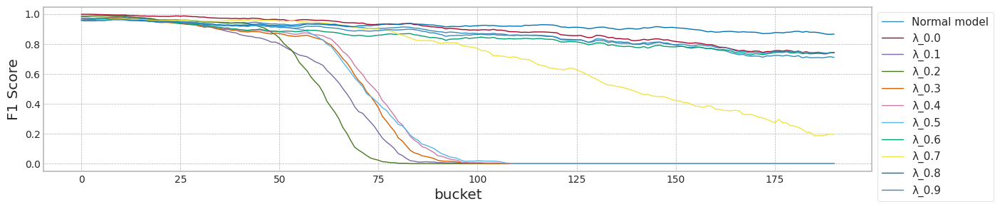

max_mean_lambda= 0.8


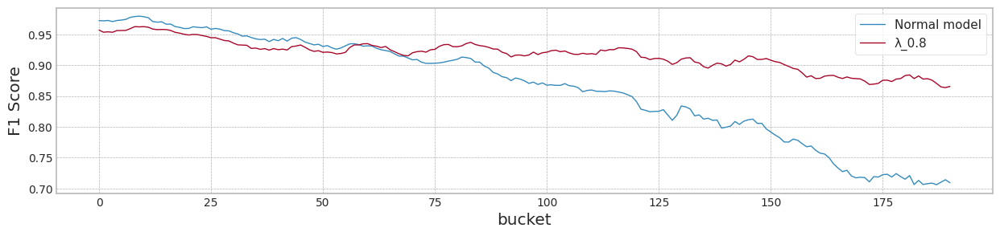

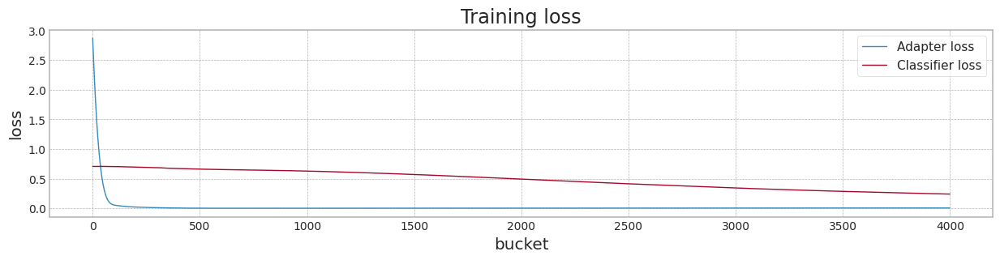

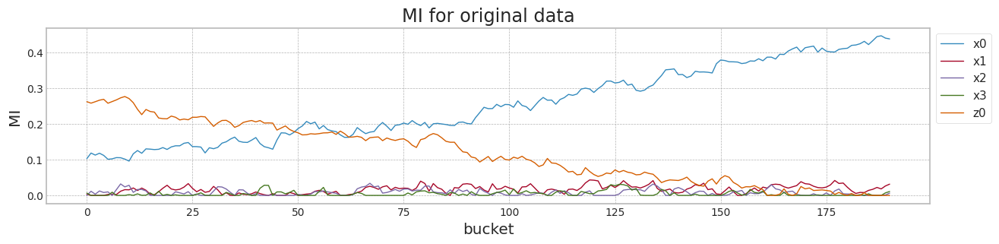

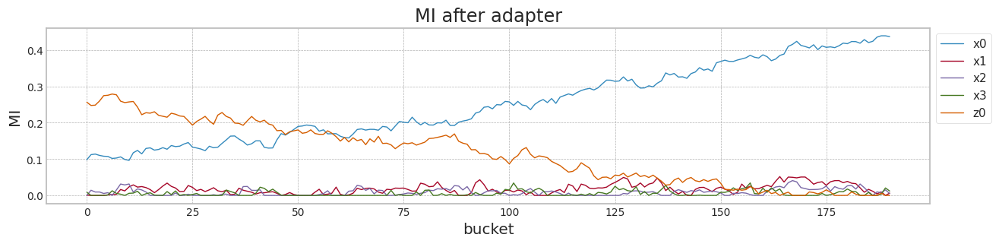

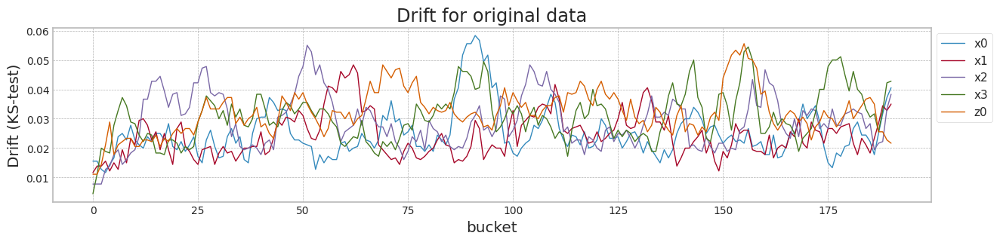

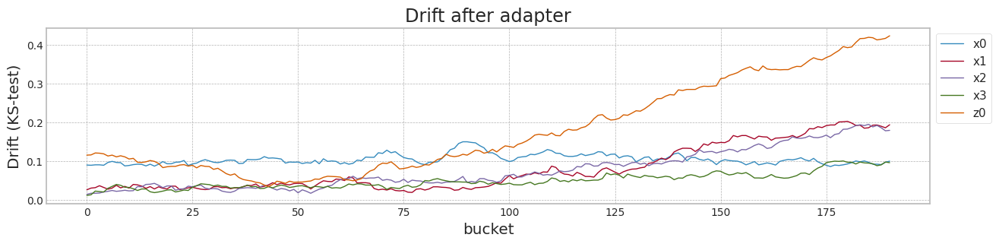

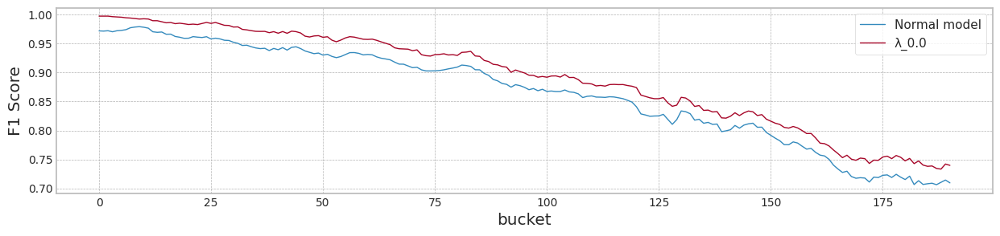

,lambda,test_f1,init_f1,mean_f1,last_f1,sum mi,std mi,sum * std,sum 1/2,std 1/2,sum 2/2,std 2/2,sum 1-2,std 1-2,sum 1+2,std 1+2
0,"Case #1, Normal model",0.972104,0.972104,0.864321,0.709419,0.404505,0.116157,0.046986,0.416156,0.110673,0.386578,0.111651,0.029578,0.000978,0.802734,0.222325
1,0.0,0.997600,0.997600,0.890187,0.739645,0.393421,0.100385,0.039494,0.393983,0.102932,0.346515,0.093673,0.047468,0.009259,0.740498,0.196605
2,0.1,0.985673,0.985673,0.323124,0.000000,0.423588,0.106378,0.045060,0.430141,0.112689,0.369587,0.099518,0.060554,0.013171,0.799728,0.212207
3,0.2,0.984218,0.984218,0.304402,0.000000,0.420244,0.109638,0.046075,0.432578,0.111590,0.369630,0.103590,0.062948,0.007999,0.802208,0.215180
4,0.3,0.969150,0.969150,0.351800,0.000000,0.417510,0.113623,0.047439,0.435538,0.114962,0.374911,0.114032,0.060627,0.000930,0.810449,0.228994
5,0.4,0.964995,0.964995,0.365730,0.000000,0.430313,0.115909,0.049877,0.415018,0.116263,0.396239,0.107938,0.018780,0.008325,0.811257,0.224201
6,0.5,0.964573,0.964573,0.365317,0.000000,0.408816,0.113618,0.046449,0.443731,0.116914,0.374867,0.107774,0.068863,0.009140,0.818598,0.224689
7,0.6,0.961810,0.961810,0.842912,0.743710,0.400858,0.112936,0.045272,0.425220,0.121386,0.375827,0.106959,0.049394,0.014427,0.801047,0.228344
8,0.7,0.959586,0.959586,0.704333,0.194617,0.404533,0.117257,0.047434,0.428423,0.123512,0.380531,0.115270,0.047892,0.008242,0.808954,0.238782
9,0.8,0.956808,0.956808,0.917190,0.865485,0.405781,0.112997,0.045852,0.430180,0.122258,0.391504,0.118538,0.038676,0.003720,0.821683,0.240796


In [66]:
drift_tolerant(X1, Y1,train_size, test_size,avaible_range = np.max(X1['b']+1))

## synthetic data의 생성 (Case #3 MI의 증감(상대적), Drift의 증가)

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift, MI는 고정

### Dataset 준비

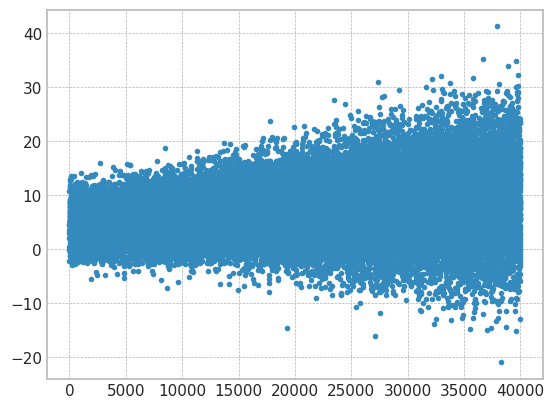

In [67]:
import matplotlib.pyplot as plt

seed_everything(2)

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

x2 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x2[:,ix] = np.random.normal(1,cor_,data_size)

y2_array = []
cor_const = 3/x2.shape[0]
for ii in range(x2.shape[0]):
    e = np.random.normal(0.0+10*ii/40000, 5*cor_const * ii)
    e1 = 0.0 #np.random.normal(0.0, cor_const * ii)
    x2[ii,4] = x2[ii,4] + e
    y2_array.append(np.sum(cor * x2[ii])+e1)

plt.plot(y2_array,'.')

In [68]:
m = 5 #np.mean(y2_array)
print(m)
y2 = [1 if y_ > m else 0 for y_ in y2_array]
sum(y2)

5


26135

### 실험

MI Analysis MI Max 0.22487, Min 0.00191, Mean 0.07138, Std 0.08241
Dataset structure X_train, (1800, 5) X_test, (1800, 5) X_live (39800, 5)
Truncate 7200 rows from live_set (39800, 5)
Search MI & Drift...for X_live_set (191, 1800, 5)


100%|██████████| 191/191 [00:07<00:00, 24.50it/s]


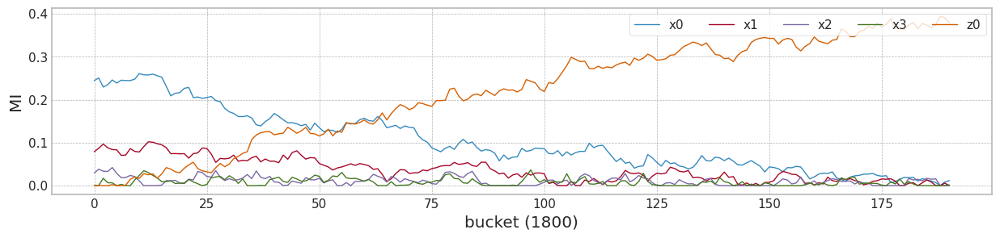

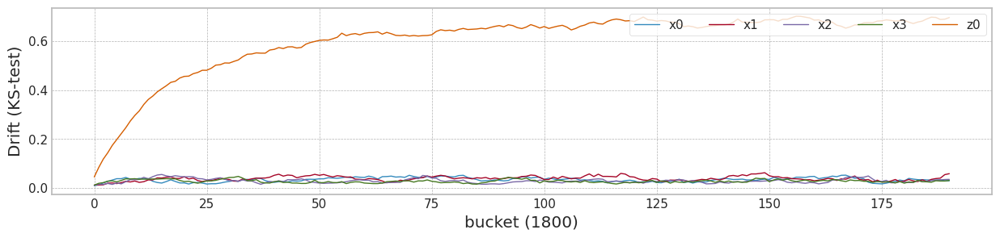

In [69]:
columns=['x0','x1','x2','x3','z0']
X2 = pd.DataFrame(x2,columns=columns)

train_size = 1800
test_size = 200

X1,Y1 = check_mi_drift(X2, y2,train_size, test_size)

In [70]:
X1['b'] = [int(b/700) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.391378,0.179737,0.412932,0.754981,0.336829,0
1,0.439860,0.516005,0.490105,0.540805,0.398226,0
2,0.160132,0.417404,0.389905,0.423808,0.347760,0
3,0.668025,0.621269,0.663604,0.508593,0.540260,0
4,0.206230,0.473113,0.366847,0.584109,0.361078,0
...,...,...,...,...,...,...
39995,0.321563,0.552908,0.399885,0.610627,3.089269,57
39996,0.380574,0.622177,0.454242,0.441404,0.777635,57
39997,0.370265,0.491261,0.156487,0.514722,5.363135,57
39998,0.388943,0.572886,0.872513,0.683365,-0.954199,57


lambda_f2 1.0
######################### Lambda -0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.01it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9579735175590097
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.70it/s]


mean of drift:
x0    0.033307
x1    0.038115
x2    0.028214
x3    0.026774
z0    0.603037
dtype: float64
Mean F1 for all data: 0.8797823750368523
######################### Lambda 0.0 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.56it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9988545246277205
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.93it/s]


mean of drift:
x0    0.752746
x1    0.760300
x2    1.000000
x3    1.000000
z0    0.836803
dtype: float64
Mean F1 for all data: 0.9255980830598004
######################### Lambda 0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.87it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9925671812464265
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.84it/s]


mean of drift:
x0    0.747437
x1    0.188610
x2    0.500128
x3    0.431780
z0    0.437240
dtype: float64
Mean F1 for all data: 0.31517652109298777
######################### Lambda 0.2 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.24it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9822552947910703
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.86it/s]


mean of drift:
x0    0.857051
x1    0.632728
x2    0.613354
x3    0.293645
z0    0.539770
dtype: float64
Mean F1 for all data: 0.1576391006741131
######################### Lambda 0.3 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.96it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9775474956822107
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.79it/s]


mean of drift:
x0    0.774575
x1    0.820387
x2    0.550529
x3    0.306955
z0    0.875457
dtype: float64
Mean F1 for all data: 0.14942737684004143
######################### Lambda 0.4 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.70it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9734717416378317
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 23.17it/s]


mean of drift:
x0    0.847938
x1    0.719680
x2    0.389412
x3    0.304459
z0    0.920212
dtype: float64
Mean F1 for all data: 0.13307608753962963
######################### Lambda 0.5 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.27it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9644495412844036
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.88it/s]


mean of drift:
x0    0.885916
x1    0.823136
x2    0.085166
x3    0.276498
z0    0.923138
dtype: float64
Mean F1 for all data: 0.09317750282864738
######################### Lambda 0.6 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.08it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9517241379310345
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 23.08it/s]


mean of drift:
x0    0.869203
x1    0.743010
x2    0.144412
x3    0.249895
z0    0.914718
dtype: float64
Mean F1 for all data: 0.09954183195971178
######################### Lambda 0.7 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.93it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9405034324942793
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.98it/s]


mean of drift:
x0    0.852487
x1    0.662990
x2    0.152557
x3    0.098935
z0    0.614232
dtype: float64
Mean F1 for all data: 0.11878755019177999
######################### Lambda 0.8 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.26it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9440639269406392
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 23.32it/s]


mean of drift:
x0    0.757848
x1    0.314351
x2    0.169401
x3    0.060297
z0    0.601131
dtype: float64
Mean F1 for all data: 0.1900971500051188
######################### Lambda 0.9 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.92it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9451428571428572
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.74it/s]


mean of drift:
x0    0.332856
x1    0.135419
x2    0.147519
x3    0.039901
z0    0.599549
dtype: float64
Mean F1 for all data: 0.6545753677845354


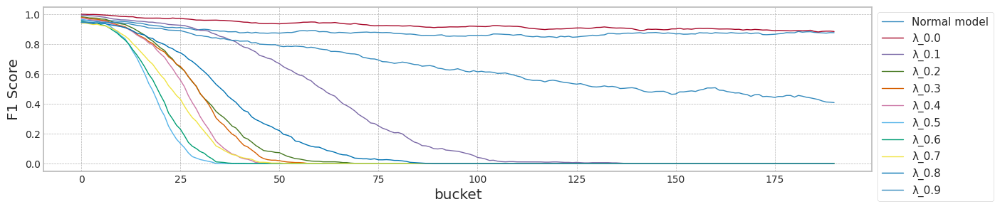

max_mean_lambda= 0.0


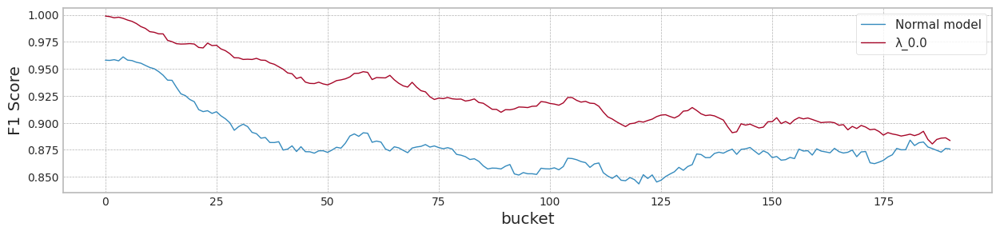

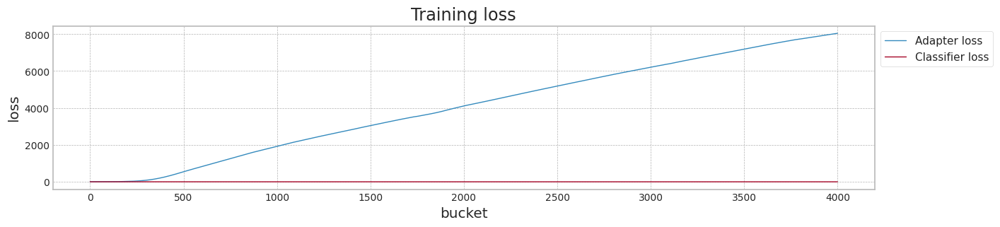

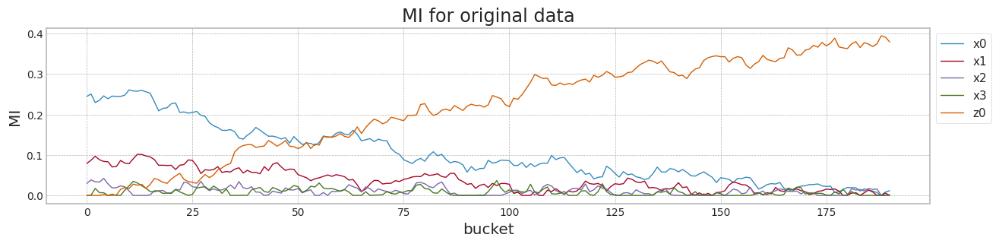

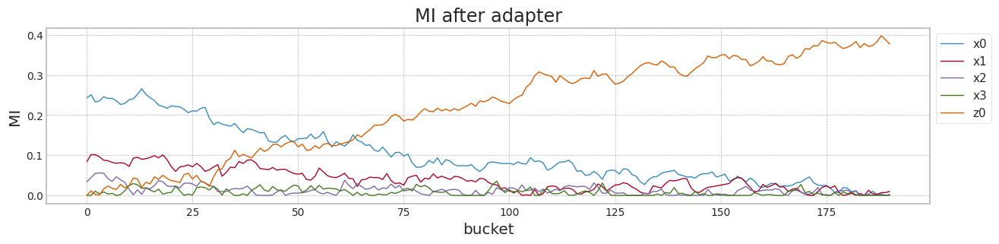

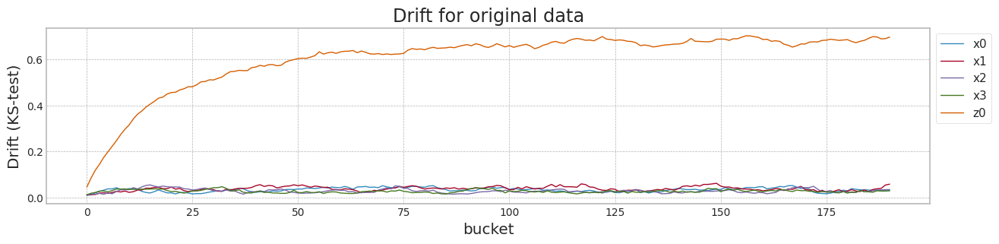

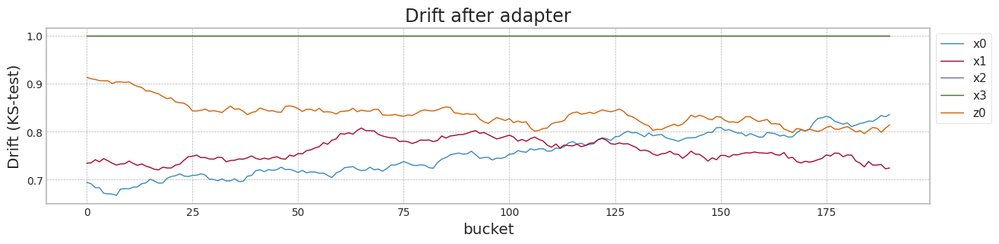

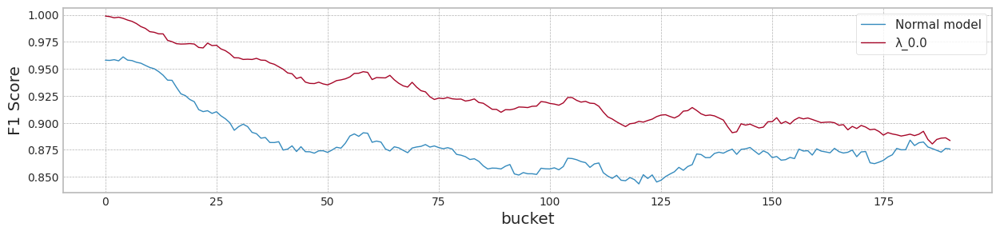

,lambda,test_f1,init_f1,mean_f1,last_f1,sum mi,std mi,sum * std,sum 1/2,std 1/2,sum 2/2,std 2/2,sum 1-2,std 1-2,sum 1+2,std 1+2
0,"Case #1, Normal model",0.957974,0.957974,0.879782,0.875745,0.357895,0.094693,0.033890,0.401104,0.095670,0.372965,0.099913,0.028139,0.004242,0.774068,0.195583
1,0.0,0.998855,0.998855,0.925598,0.883541,0.362253,0.090333,0.032723,0.398755,0.088925,0.373396,0.101125,0.025359,0.012200,0.772150,0.190050
2,0.1,0.992567,0.992567,0.315177,0.000000,0.360793,0.094740,0.034182,0.362169,0.082697,0.371574,0.090042,0.009405,0.007345,0.733743,0.172740
3,0.2,0.982255,0.982255,0.157639,0.000000,0.424124,0.096365,0.040871,0.430280,0.097956,0.393774,0.089376,0.036506,0.008580,0.824054,0.187332
4,0.3,0.977547,0.977547,0.149427,0.000000,0.411264,0.097012,0.039897,0.423940,0.098551,0.390840,0.094290,0.033100,0.004261,0.814781,0.192842
5,0.4,0.973472,0.973472,0.133076,0.000000,0.393181,0.103284,0.040609,0.410391,0.097778,0.370203,0.095753,0.040188,0.002024,0.780594,0.193531
6,0.5,0.964450,0.964450,0.093178,0.000000,0.396618,0.098188,0.038943,0.439791,0.094139,0.389565,0.102269,0.050227,0.008129,0.829356,0.196408
7,0.6,0.951724,0.951724,0.099542,0.000000,0.375377,0.101387,0.038058,0.405911,0.091521,0.397101,0.106657,0.008811,0.015136,0.803012,0.198178
8,0.7,0.940503,0.940503,0.118788,0.000000,0.386347,0.106807,0.041265,0.384925,0.098016,0.401592,0.118198,0.016667,0.020182,0.786517,0.216214
9,0.8,0.944064,0.944064,0.190097,0.000000,0.403492,0.112684,0.045467,0.386741,0.103447,0.385411,0.117802,0.001330,0.014355,0.772152,0.221249


In [71]:
drift_tolerant(X1, Y1,train_size, test_size,avaible_range = np.max(X1['b']+1))

## synthetic data의 생성 (Case #4 MI의 고정, Drift의 증가)

### Dataset 준비

In [72]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

y3= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x3 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    '''
    x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)
    '''
    # z0
    if ix == 4:
        for ii in range(len(y3)):
            x3[ii,ix] = y3[ii] + np.random.normal(0.0 + 4*ii/data_size,cor_)
    else:
        x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)


### 실험

MI Analysis MI Max 0.20278, Min 0.05089, Mean 0.11172, Std 0.05282
Dataset structure X_train, (1800, 5) X_test, (1800, 5) X_live (39800, 5)
Truncate 7200 rows from live_set (39800, 5)
Search MI & Drift...for X_live_set (191, 1800, 5)


100%|██████████| 191/191 [00:07<00:00, 24.08it/s]


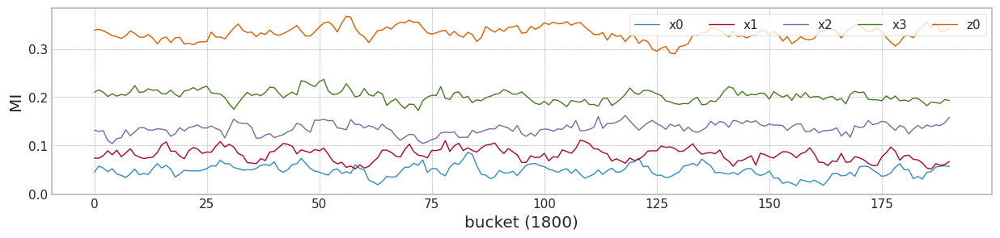

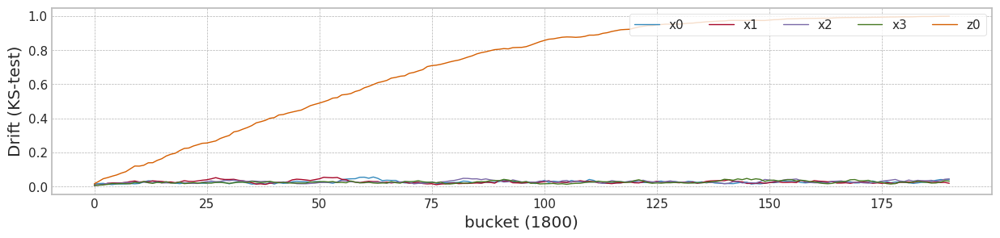

In [73]:
columns=['x0','x1','x2','x3','z0']
X3 = pd.DataFrame(x3,columns=columns)

train_size = 1800
test_size = 200

X1,Y1 = check_mi_drift(X3, y3,train_size, test_size)

In [74]:
X1['b'] = [int(b/700) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.511187,0.348595,0.564807,0.482506,0.503588,0
1,0.435937,0.524656,0.595436,0.762536,0.617637,0
2,0.479071,0.682932,0.738867,0.596141,0.364513,0
3,0.572894,0.251745,0.392850,0.522275,0.371604,0
4,0.562890,0.613393,0.481594,0.596584,0.638879,0
...,...,...,...,...,...,...
39995,0.332800,0.214564,0.468946,0.614324,1.080212,57
39996,0.414601,0.252607,0.438192,0.601093,1.097577,57
39997,0.361400,0.558191,0.590386,0.612855,1.454822,57
39998,0.459619,0.212723,0.148134,0.664097,1.259975,57


lambda_f2 1.0
######################### Lambda -0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.39it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9285714285714285
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.16it/s]


mean of drift:
x0    0.025457
x1    0.026437
x2    0.027571
x3    0.025285
z0    0.703194
dtype: float64
Mean F1 for all data: 0.7405112851250151
######################### Lambda 0.0 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.62it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9278688524590163
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.74it/s]


mean of drift:
x0    1.000000
x1    0.992417
x2    0.902036
x3    1.000000
z0    0.936536
dtype: float64
Mean F1 for all data: 0.7591692137600442
######################### Lambda 0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.87it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9302071973827699
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.04it/s]


mean of drift:
x0    0.836460
x1    0.455974
x2    0.827848
x3    0.358138
z0    0.600486
dtype: float64
Mean F1 for all data: 0.848768813553998
######################### Lambda 0.2 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.45it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.925421883505716
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.03it/s]


mean of drift:
x0    0.840032
x1    0.228933
x2    0.774878
x3    0.250983
z0    0.708147
dtype: float64
Mean F1 for all data: 0.9097660148272333
######################### Lambda 0.3 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.66it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9205658324265505
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.73it/s]


mean of drift:
x0    0.438970
x1    0.122324
x2    0.550250
x3    0.164005
z0    0.661259
dtype: float64
Mean F1 for all data: 0.7768437867515988
######################### Lambda 0.4 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.05it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9213239283776452
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.93it/s]


mean of drift:
x0    0.454119
x1    0.152606
x2    0.549412
x3    0.127228
z0    0.661361
dtype: float64
Mean F1 for all data: 0.7421922553430699
######################### Lambda 0.5 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.52it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9257452574525745
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.24it/s]


mean of drift:
x0    0.164404
x1    0.141274
x2    0.443604
x3    0.109401
z0    0.699491
dtype: float64
Mean F1 for all data: 0.734893756156125
######################### Lambda 0.6 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.06it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9259058950784208
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.93it/s]


mean of drift:
x0    0.141149
x1    0.121120
x2    0.089599
x3    0.099933
z0    0.710055
dtype: float64
Mean F1 for all data: 0.7366588485013372
######################### Lambda 0.7 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.94it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9253246753246753
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.92it/s]


mean of drift:
x0    0.055404
x1    0.111766
x2    0.102731
x3    0.086065
z0    0.682266
dtype: float64
Mean F1 for all data: 0.742343743666822
######################### Lambda 0.8 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.32it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9247428262046561
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.45it/s]


mean of drift:
x0    0.062827
x1    0.109584
x2    0.074529
x3    0.049485
z0    0.625931
dtype: float64
Mean F1 for all data: 0.7525795612044596
######################### Lambda 0.9 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.02it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9259058950784208
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.29it/s]


mean of drift:
x0    0.048866
x1    0.081449
x2    0.055599
x3    0.039866
z0    0.688764
dtype: float64
Mean F1 for all data: 0.7360752537536824


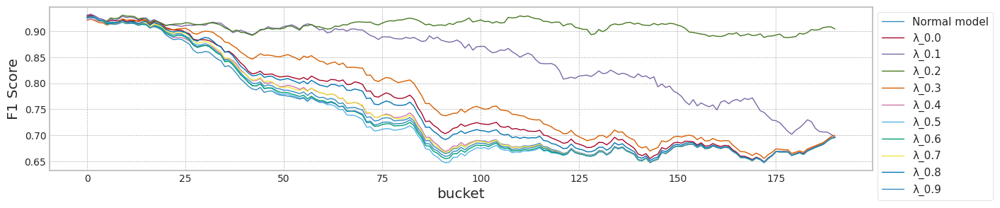

max_mean_lambda= 0.2


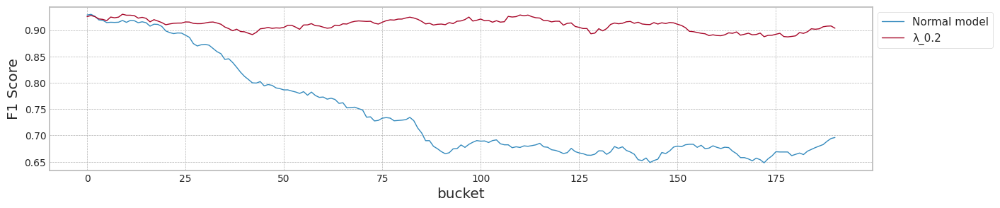

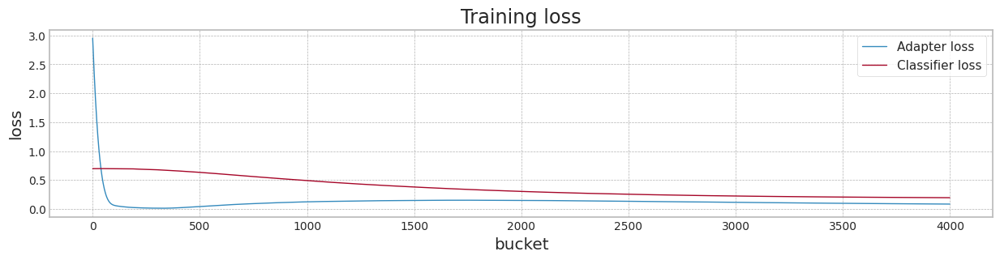

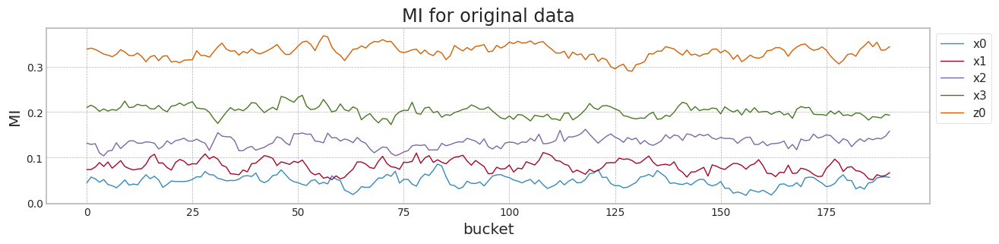

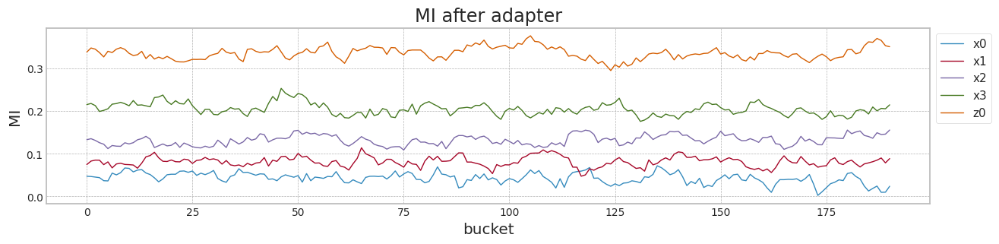

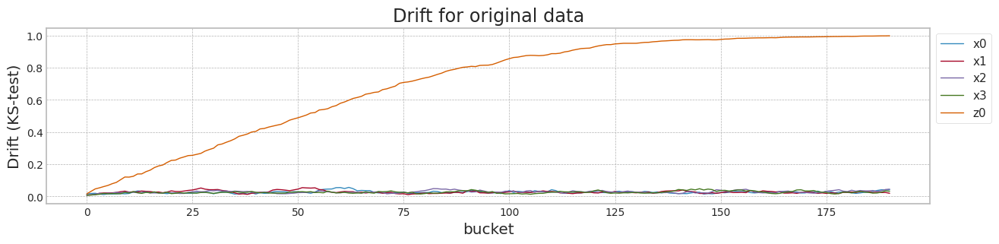

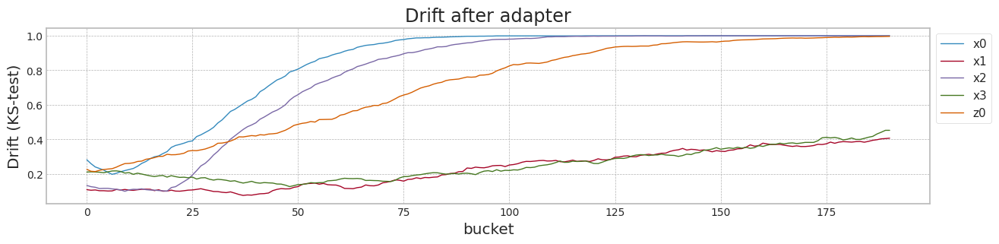

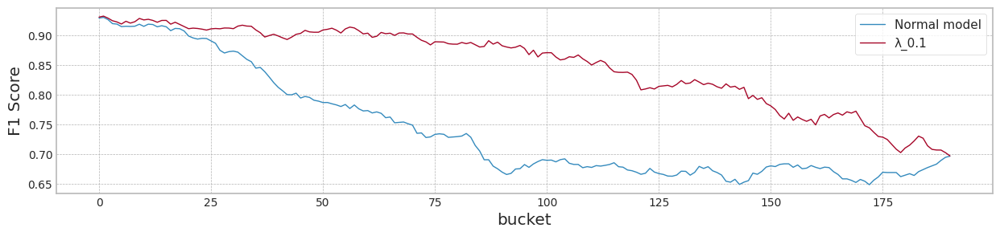

,lambda,test_f1,init_f1,mean_f1,last_f1,sum mi,std mi,sum * std,sum 1/2,std 1/2,sum 2/2,std 2/2,sum 1-2,std 1-2,sum 1+2,std 1+2
0,"Case #1, Normal model",0.928571,0.928571,0.740511,0.696125,0.916524,0.126690,0.116114,0.938647,0.124392,0.847101,0.126034,0.091547,0.001642,1.785748,0.250427
1,0.0,0.927869,0.927869,0.759169,0.696629,0.949112,0.126115,0.119697,0.960808,0.129188,0.823075,0.118038,0.137733,0.011149,1.783883,0.247226
2,0.1,0.930207,0.930207,0.848769,0.696705,0.912971,0.128324,0.117156,0.921138,0.135825,0.848239,0.125831,0.072899,0.009994,1.769377,0.261655
3,0.2,0.925422,0.925422,0.909766,0.903548,0.928972,0.131959,0.122586,0.965025,0.136196,0.846428,0.130897,0.118597,0.005300,1.811454,0.267093
4,0.3,0.920566,0.920566,0.776844,0.700182,0.891188,0.133657,0.119113,0.885950,0.141202,0.836089,0.137053,0.049860,0.004150,1.722039,0.278255
5,0.4,0.921324,0.921324,0.742192,0.696125,0.918732,0.136369,0.125287,0.935313,0.135324,0.837331,0.142776,0.097982,0.007452,1.772645,0.278099
6,0.5,0.925745,0.925745,0.734894,0.696125,0.920659,0.134660,0.123976,0.947604,0.132148,0.855279,0.136321,0.092325,0.004173,1.802883,0.268470
7,0.6,0.925906,0.925906,0.736659,0.696125,0.890857,0.137121,0.122155,0.910869,0.129453,0.819310,0.140610,0.091560,0.011157,1.730179,0.270063
8,0.7,0.925325,0.925325,0.742344,0.696125,0.924655,0.130888,0.121027,0.921627,0.129235,0.831259,0.143968,0.090368,0.014734,1.752886,0.273203
9,0.8,0.924743,0.924743,0.752580,0.696125,0.923055,0.133690,0.123403,0.931626,0.132787,0.835015,0.145227,0.096611,0.012440,1.766641,0.278014


In [75]:
drift_tolerant(X1, Y1,train_size, test_size,avaible_range = np.max(X1['b']+1))

## synthetic data의 생성 (Case #5 - Case #1,2,3,4의 상황이 각 feature에 혼재되어 있는 경우)

### Dataset 준비

In [17]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.5 , 0.7, 2.5])

x4 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x4[:,ix] = np.random.normal(1,cor_,data_size)

y4_array = []
cor_const = cor[4]
cor_const2 = 3/x4.shape[0]
for ii in range(x4.shape[0]):
    # Case #2, MI의 증감(상대적), Drift의 고정 - z0
    cor[4] = cor[4] - cor_const / x4.shape[0]
    e = np.random.normal(0.0, 2.0)
    # Case #3 MI의 증감(상대적), Drift의 증가 - x3
    e1 = np.random.normal(0.0, 3*cor_const2 * ii)
    x4[ii,3] = x4[ii,3] + e1
    y4_array.append(np.sum(cor * x4[ii])+e)

y4 = [1 if y_ > 5 else 0 for y_ in y4_array]

for i in range(len(y4)):
    #Case #1 MI의 감소, Drift의 증가 - x2
    x4[i,2] = y4[i] + np.random.normal(1,0.5+(i/data_size))
    #Case #4 MI의 고정, Drift의 증가 - x1
    x4[i,1] = y4[i] + np.random.normal(0.0 + 4*(i/data_size),cor[1])


### 실험

MI Analysis MI Max 0.14553, Min 0.02498, Mean 0.08409, Std 0.04454
Dataset structure X_train, (1800, 5) X_test, (1800, 5) X_live (39800, 5)
Truncate 7200 rows from live_set (39800, 5)
Search MI & Drift...for X_live_set (191, 1800, 5)


100%|██████████| 191/191 [00:07<00:00, 24.55it/s]


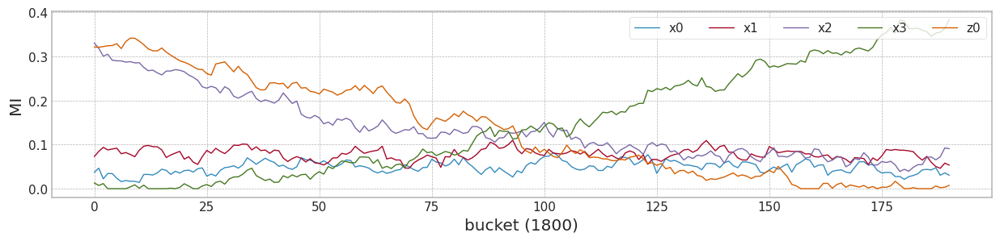

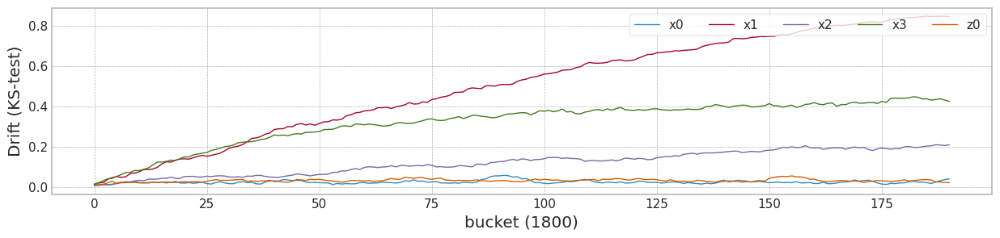

In [18]:
columns=['x0','x1','x2','x3','z0']
X4 = pd.DataFrame(x4,columns=columns)

train_size = 1800
test_size = 200

X1,Y1 = check_mi_drift(X4, y4,train_size, test_size)

-----------------------------------600----------------------------------------
lambda_f2 1.0
######################### Lambda -0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.72it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9474662947466295
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.47it/s]


mean of drift:
x0    0.024977
x1    0.502824
x2    0.120791
x3    0.320617
z0    0.032225
dtype: float64
Mean F1 for all data: 0.7787885224109372
######################### Lambda 0.0 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.15it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9589428975932043
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.63it/s]


mean of drift:
x0    1.000000
x1    0.998604
x2    0.999415
x3    1.000000
z0    0.883941
dtype: float64
Mean F1 for all data: 0.7523995749358151
######################### Lambda 0.5 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 223.80it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9451162790697675
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.17it/s]


mean of drift:
x0    0.607333
x1    0.262472
x2    0.561699
x3    0.329863
z0    0.511309
dtype: float64
Mean F1 for all data: 0.4248846720912005
######################### Lambda 0.9 ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 218.92it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9383057090239411
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.52it/s]


mean of drift:
x0    0.202464
x1    0.428554
x2    0.167525
x3    0.314587
z0    0.256259
dtype: float64
Mean F1 for all data: 0.6392935778659141


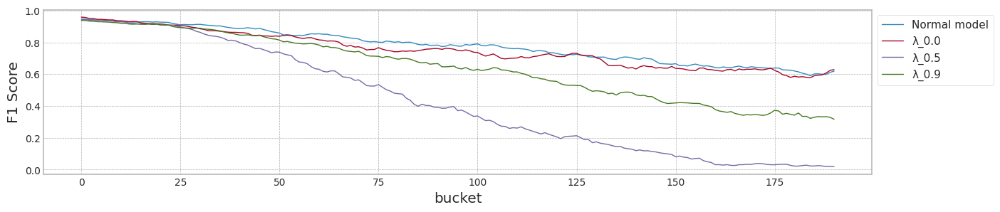

max_mean_lambda= 0.0


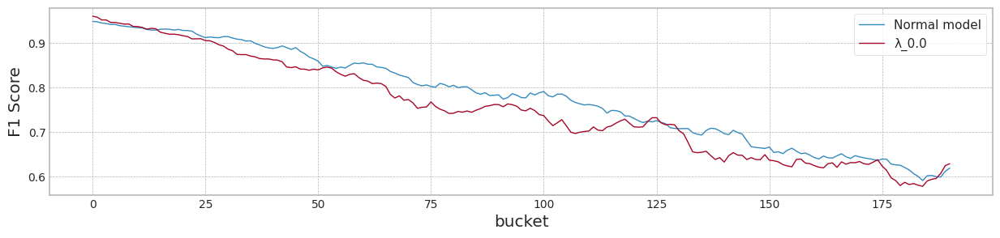

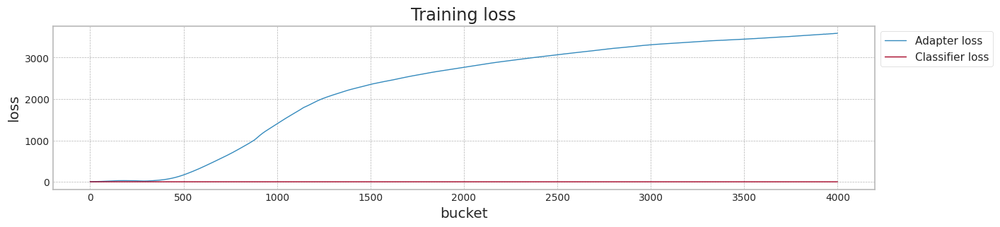

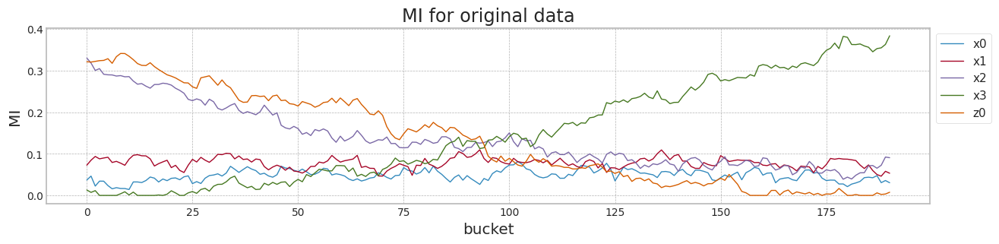

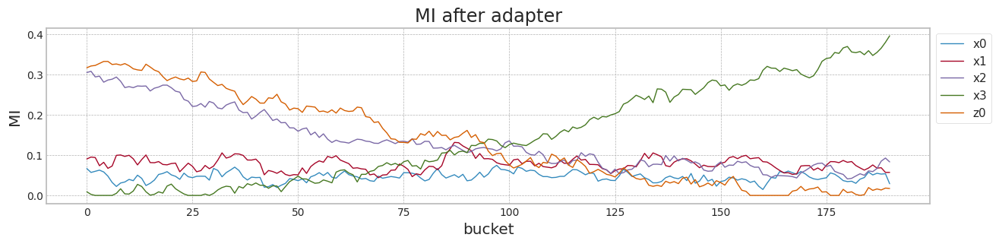

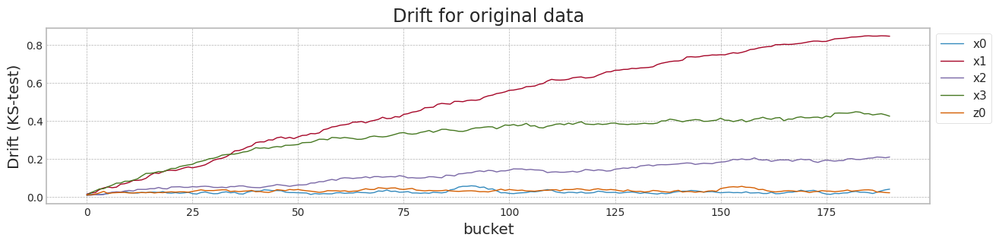

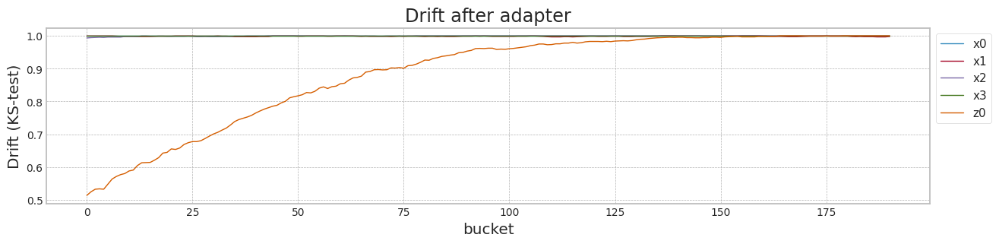

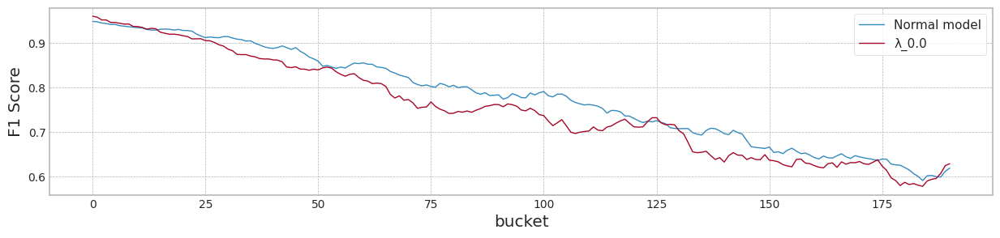

-----------------------------------700----------------------------------------
lambda_f2 1.0
######################### Lambda -0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.88it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9474662947466295
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.03it/s]


mean of drift:
x0    0.024977
x1    0.502824
x2    0.120791
x3    0.320617
z0    0.032225
dtype: float64
Mean F1 for all data: 0.7787885224109372
######################### Lambda 0.0 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 222.79it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9588263132986276
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.95it/s]


mean of drift:
x0    1.000000
x1    0.772688
x2    0.999072
x3    1.000000
z0    0.832749
dtype: float64
Mean F1 for all data: 0.8318681127809566
######################### Lambda 0.5 ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 222.13it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9455560725919032
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.67it/s]


mean of drift:
x0    0.367868
x1    0.341731
x2    0.218220
x3    0.333941
z0    0.290762
dtype: float64
Mean F1 for all data: 0.7275304425857961
######################### Lambda 0.9 ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 223.98it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9378739070409572
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.22it/s]


mean of drift:
x0    0.176222
x1    0.449625
x2    0.143994
x3    0.313383
z0    0.165794
dtype: float64
Mean F1 for all data: 0.6626233664034124


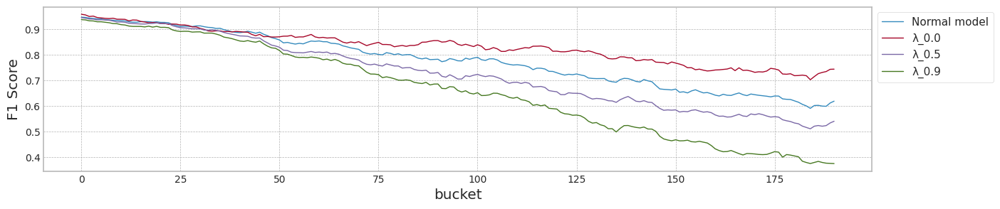

max_mean_lambda= 0.0


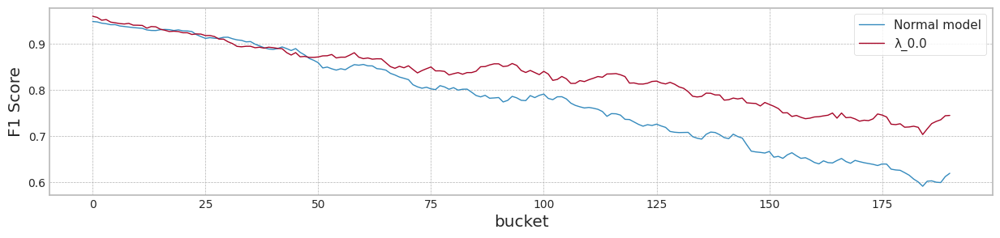

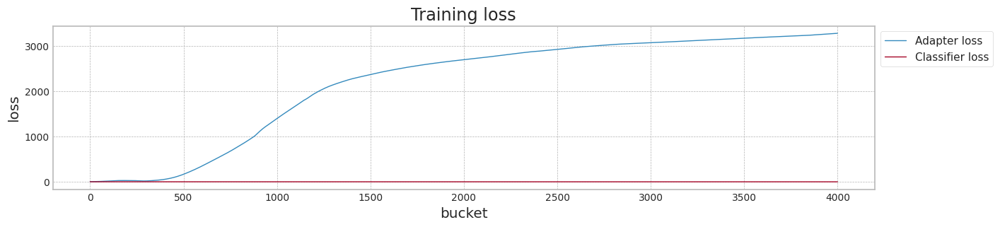

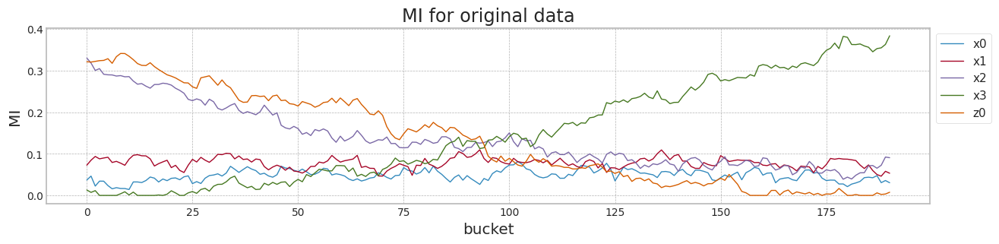

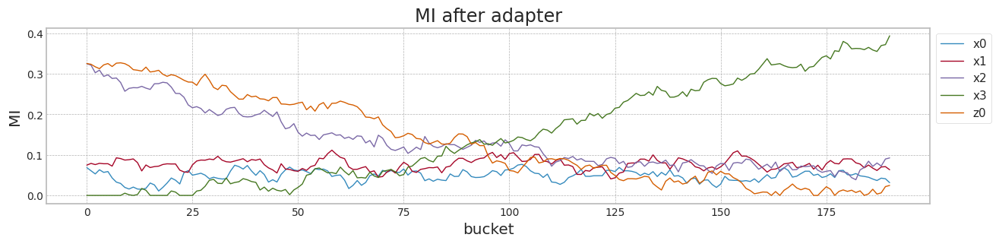

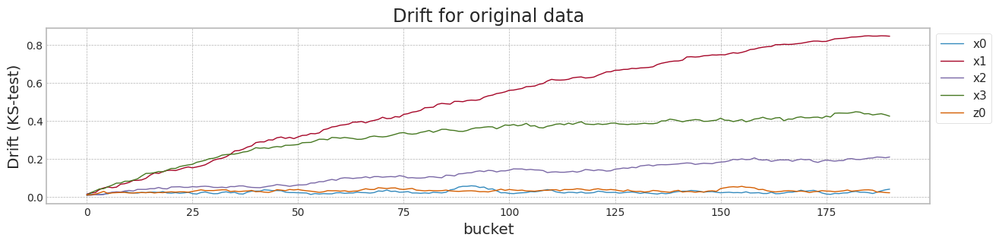

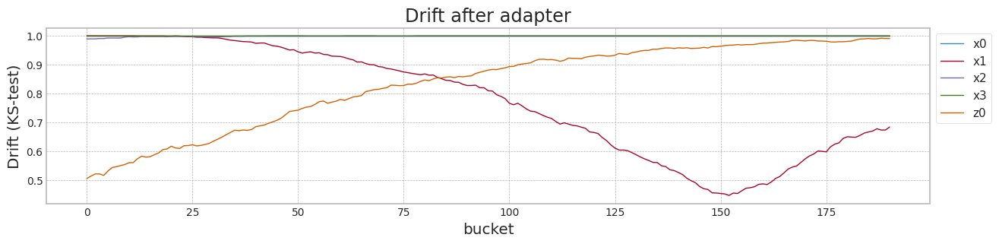

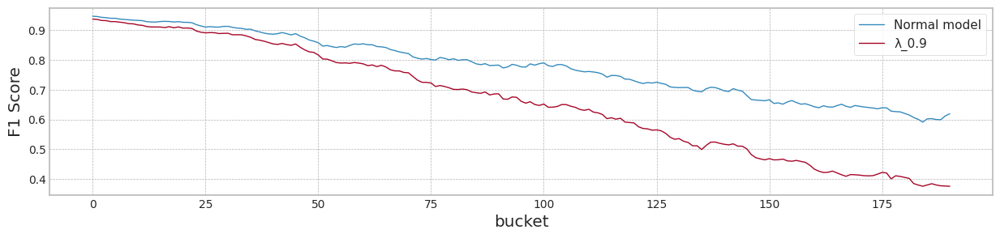

-----------------------------------800----------------------------------------
lambda_f2 1.0
######################### Lambda -0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.55it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9474662947466295
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 22.59it/s]


mean of drift:
x0    0.024977
x1    0.502824
x2    0.120791
x3    0.320617
z0    0.032225
dtype: float64
Mean F1 for all data: 0.7787885224109372
######################### Lambda 0.0 ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 217.60it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9593188268684958
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.39it/s]


mean of drift:
x0    1.000000
x1    0.806094
x2    0.997609
x3    1.000000
z0    0.925195
dtype: float64
Mean F1 for all data: 0.8370441612472898
######################### Lambda 0.5 ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 218.54it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9450651769087522
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.63it/s]


mean of drift:
x0    0.362816
x1    0.264700
x2    0.508598
x3    0.349171
z0    0.409660
dtype: float64
Mean F1 for all data: 0.7353618030529352
######################### Lambda 0.9 ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 215.92it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.937442502299908
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.41it/s]


mean of drift:
x0    0.141545
x1    0.445753
x2    0.166850
x3    0.313429
z0    0.199183
dtype: float64
Mean F1 for all data: 0.6522477642704828


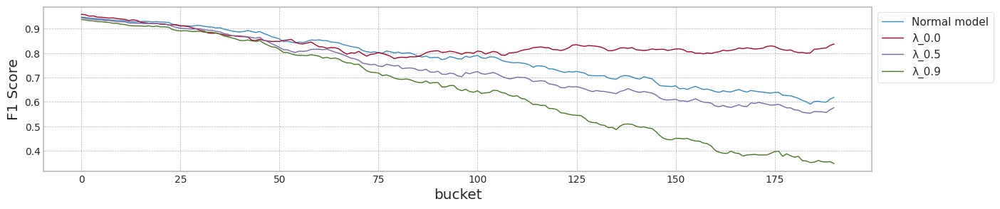

max_mean_lambda= 0.0


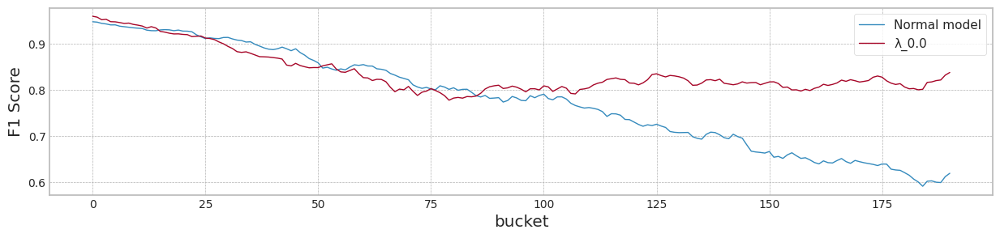

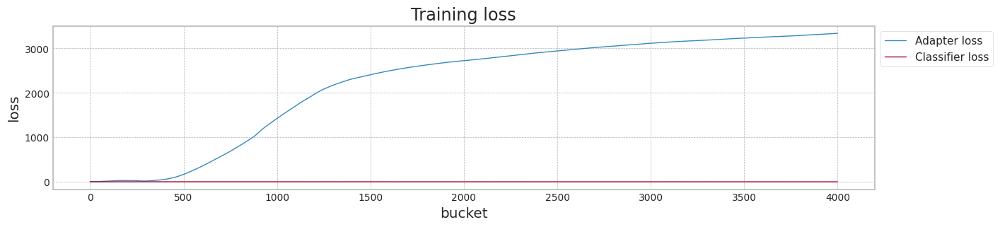

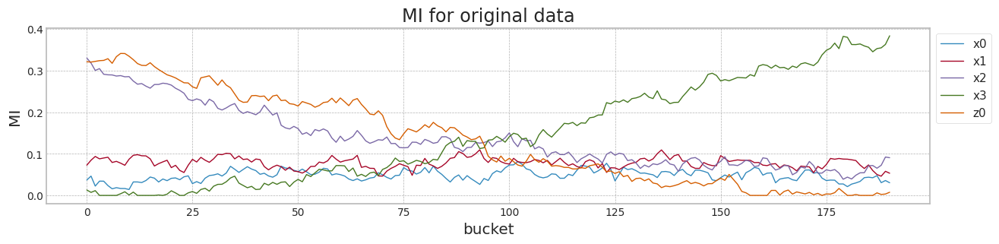

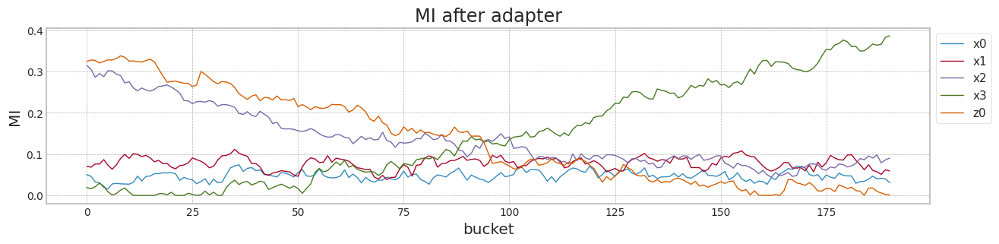

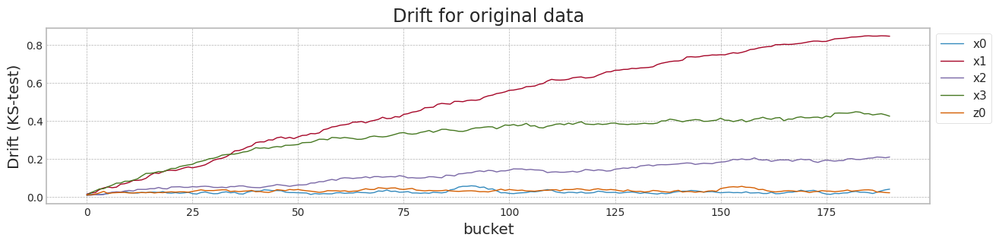

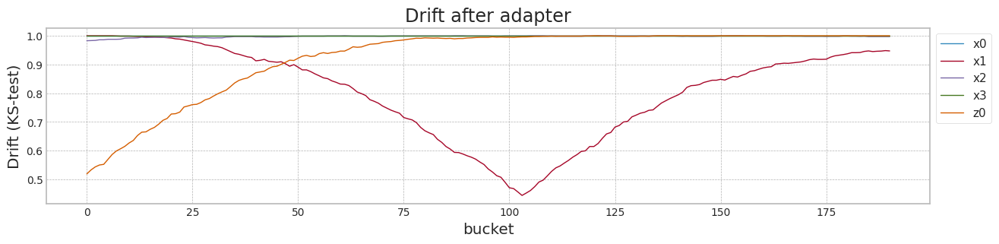

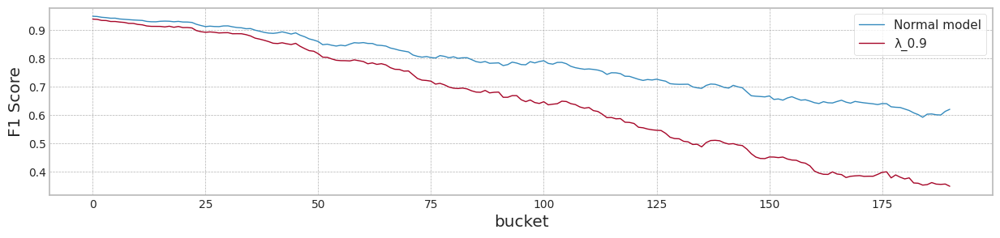

-----------------------------------900----------------------------------------
lambda_f2 1.0
######################### Lambda -0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.89it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9474662947466295
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:09<00:00, 21.12it/s]


mean of drift:
x0    0.024977
x1    0.502824
x2    0.120791
x3    0.320617
z0    0.032225
dtype: float64
Mean F1 for all data: 0.7787885224109372
######################### Lambda 0.0 ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 213.38it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9593188268684958
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.74it/s]


mean of drift:
x0    1.000000
x1    0.997609
x2    0.998927
x3    1.000000
z0    0.907981
dtype: float64
Mean F1 for all data: 0.561389353136719
######################### Lambda 0.5 ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 213.51it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9450651769087522
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.27it/s]


mean of drift:
x0    0.286670
x1    0.147699
x2    0.567150
x3    0.343741
z0    0.512103
dtype: float64
Mean F1 for all data: 0.43693472898893354
######################### Lambda 0.9 ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 218.38it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9369535204786009
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.52it/s]


mean of drift:
x0    0.198138
x1    0.418828
x2    0.208092
x3    0.315524
z0    0.281905
dtype: float64
Mean F1 for all data: 0.6277590583327853


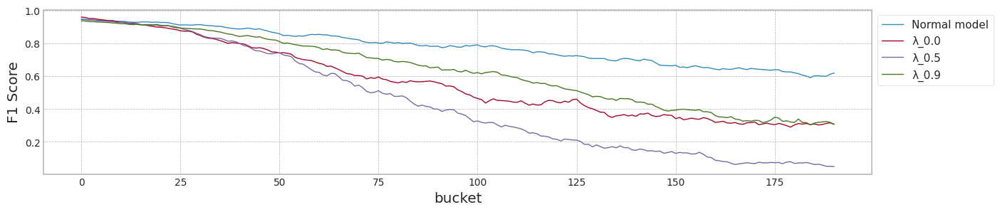

max_mean_lambda= 0.9


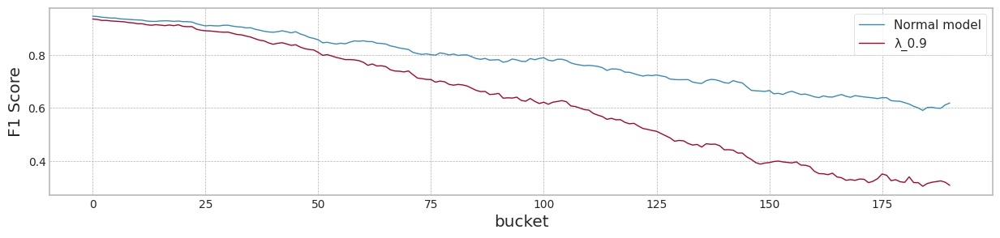

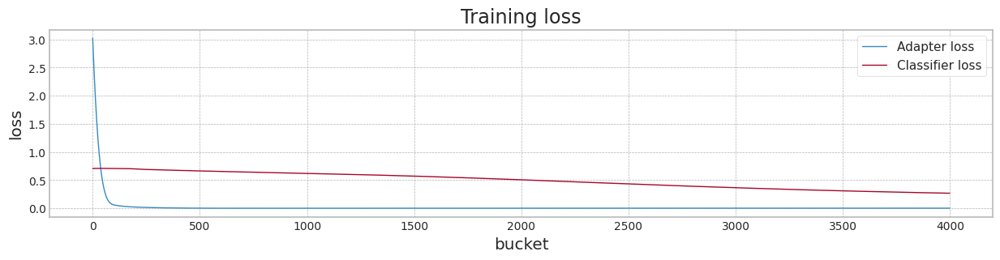

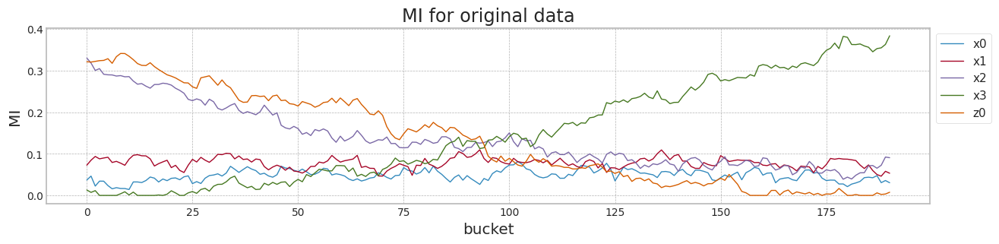

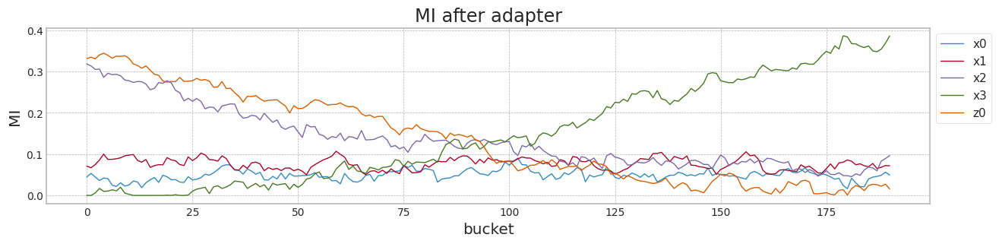

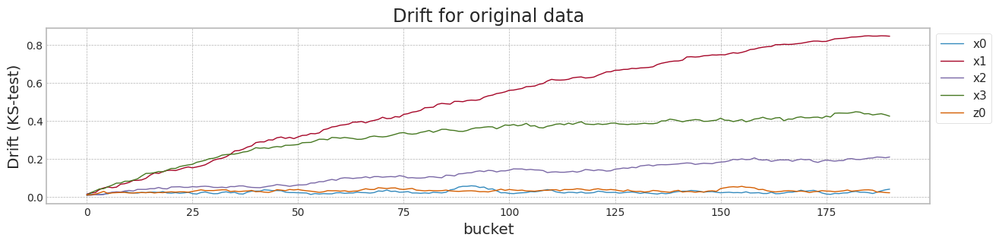

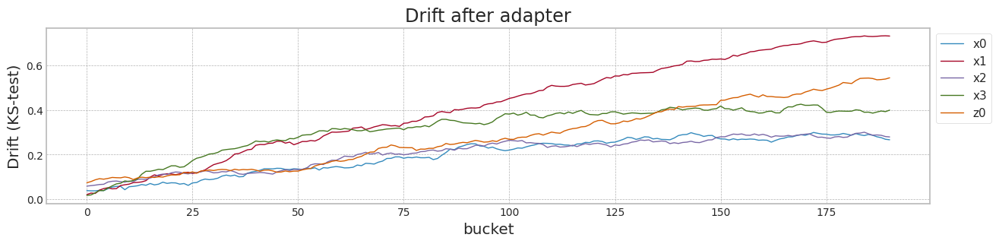

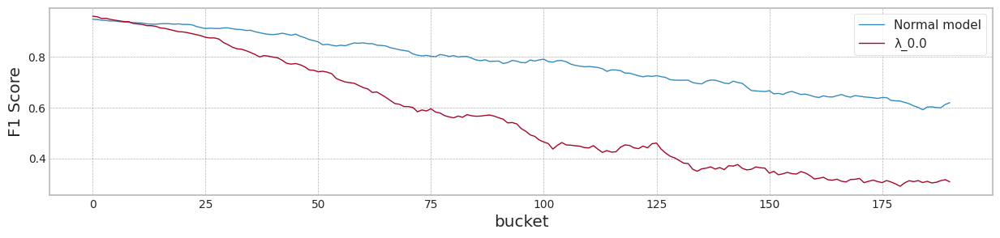

-----------------------------------1000----------------------------------------
lambda_f2 1.0
######################### Lambda -0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 607.41it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9474662947466295
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.48it/s]


mean of drift:
x0    0.024977
x1    0.502824
x2    0.120791
x3    0.320617
z0    0.032225
dtype: float64
Mean F1 for all data: 0.7787885224109372
######################### Lambda 0.0 ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 215.69it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9574669187145557
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:09<00:00, 21.02it/s]


mean of drift:
x0    0.999948
x1    0.826486
x2    0.998220
x3    1.000000
z0    0.922842
dtype: float64
Mean F1 for all data: 0.5598459471126191
######################### Lambda 0.5 ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 215.05it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9455560725919032
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.60it/s]


mean of drift:
x0    0.324328
x1    0.190407
x2    0.281513
x3    0.318784
z0    0.432196
dtype: float64
Mean F1 for all data: 0.6171793296057279
######################### Lambda 0.9 ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 219.10it/s]


ty torch.Size([1800])
y_hat (1800, 1)
Test f1 score: 0.9369535204786009
X_live.shape (39800, 6)
Truncate 7200 rows from live_set (39800, 6)
Search MI & Drift...for X_live_set torch.Size([191, 1800, 6])


100%|██████████| 191/191 [00:08<00:00, 21.94it/s]


mean of drift:
x0    0.216713
x1    0.426062
x2    0.205285
x3    0.313118
z0    0.261038
dtype: float64
Mean F1 for all data: 0.6309185839545396


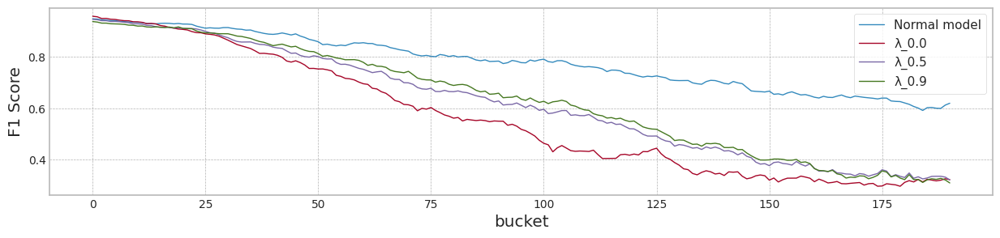

max_mean_lambda= 0.9


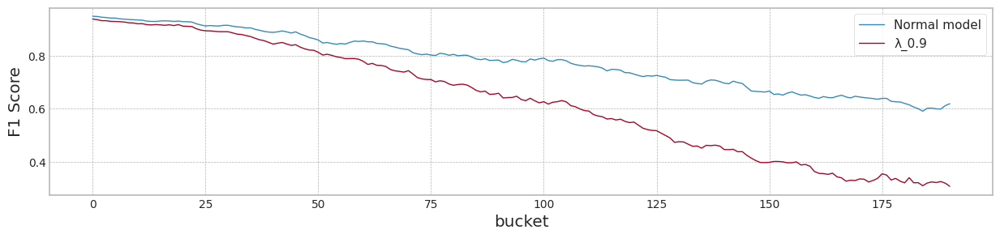

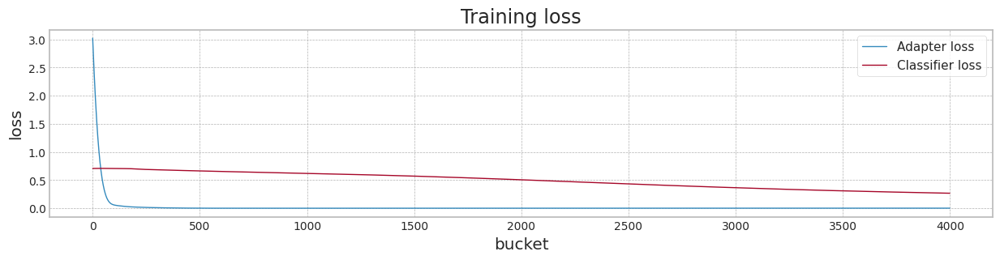

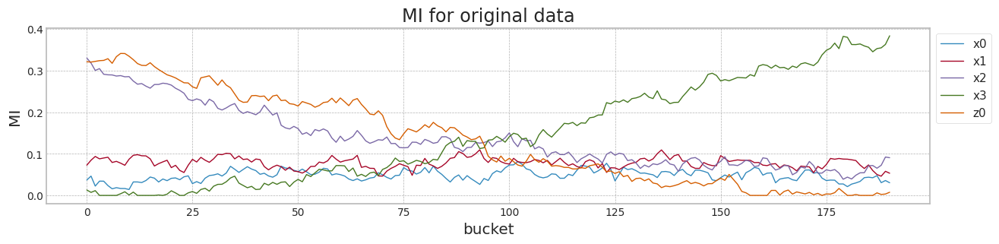

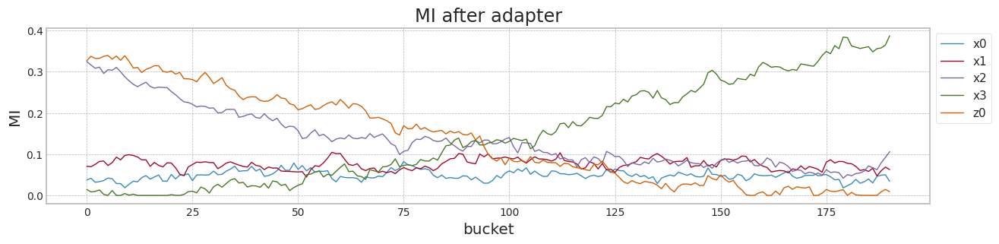

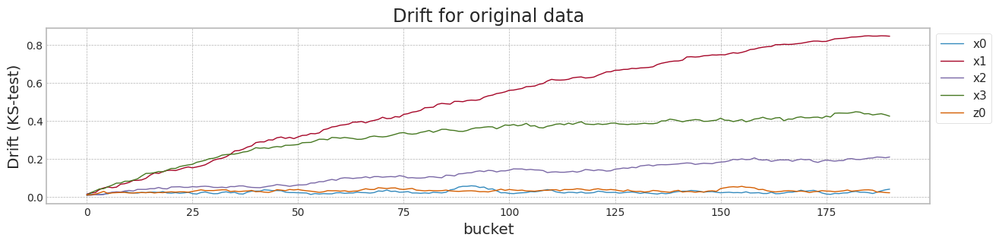

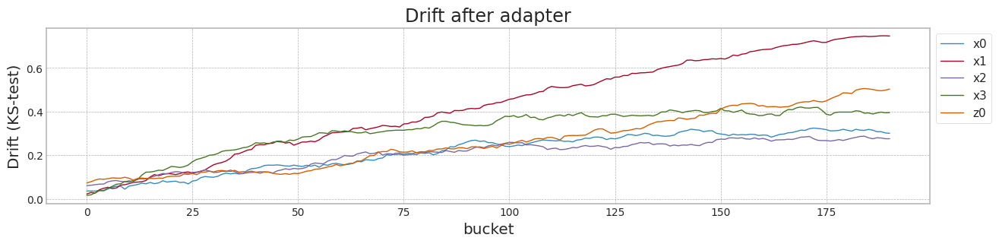

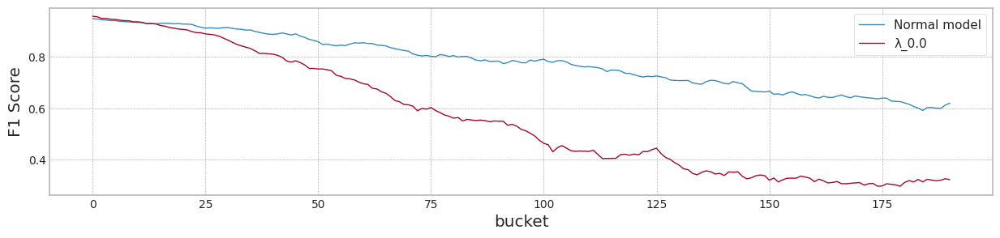

In [24]:

for v in [600,700,800,900,1000]:
    print(f"-----------------------------------{v}----------------------------------------")
    X1['b'] = [int(b/v) for b in X1.index.values]
    drift_tolerant(X1, Y1,train_size, test_size,avaible_range = np.max(X1['b'])+1)


## real-world data 의 실험

### Loan data 실험

#### Dataset 준비

##### Data load

In [76]:

if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [77]:

df_accepted = pd.read_csv("/content/drive/MyDrive/Drift/accepted_2007_to_2018Q4.csv")

print(df_accepted.shape)

(2260701, 151)


##### Data 정제

In [78]:
# for the sake of simplicity, let's consider only Fully Paid and Charged Off values:
df_accepted = df_accepted[df_accepted.loan_status.isin(['Fully Paid', 'Charged Off'])]
print(df_accepted.shape)

cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(50).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# maybe we can go further, and eliminate columns up to title:
cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(45).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# Remaining columns have missing data points, but they account for less than 0.2% of the total data. Let's remove the rows that are missing those values in those columns with dropna():
df_accepted = df_accepted.dropna()
print(df_accepted.shape)

# These are constant columns. We can drop it either.
cols_to_drop = ['out_prncp', 'out_prncp_inv', 'policy_code']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# It seems we have many "duplicated" information. Let's drop some columns, based on visual inspection at corr_pairs dataframe:
cols_to_drop = ['fico_range_low', 'funded_amnt_inv', 'funded_amnt', 'total_pymnt_inv', 'total_pymnt', 'installment', 'collection_recovery_fee', 'total_rec_prncp', 'last_fico_range_low']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

values = df_accepted.loan_status.unique()
encode = [1,0]
d = dict(zip(values, encode))
df_accepted['loan_paid'] = df_accepted['loan_status'].map(d)
df_accepted = df_accepted.drop(columns=['loan_status'])

df_accepted

(1345310, 151)
(1345310, 101)
(1345310, 56)
(1341026, 56)
(1341026, 53)
(1341026, 44)


,id,loan_amnt,term,int_rate,grade,sub_grade,home_ownership,annual_inc,verification_status,issue_d,...,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,hardship_flag,disbursement_method,debt_settlement_flag,loan_paid
0,68407277,3600.0,36 months,13.99,C,C4,MORTGAGE,55000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
1,68355089,24700.0,36 months,11.99,C,C1,MORTGAGE,65000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2,68341763,20000.0,60 months,10.78,B,B4,MORTGAGE,63000.0,Not Verified,Dec-2015,...,Joint App,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
4,68476807,10400.0,60 months,22.45,F,F1,MORTGAGE,104433.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
5,68426831,11950.0,36 months,13.44,C,C3,RENT,34000.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260688,89905081,18000.0,60 months,9.49,B,B2,OWN,130000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260690,88948836,29400.0,60 months,13.99,C,C3,MORTGAGE,180792.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260691,89996426,32000.0,60 months,14.49,C,C4,MORTGAGE,157000.0,Source Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,0
2260692,90006534,16000.0,60 months,12.79,C,C1,RENT,150000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,3.0,0.0,N,Cash,N,1


In [79]:
# droping constant columns
print(df_accepted.pymnt_plan.value_counts())
print(df_accepted.hardship_flag.value_counts())
cols_to_drop = ['id', 'pymnt_plan', 'hardship_flag']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)
cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

print(df_accepted.term.value_counts())

# convert term into either a 36 or 60 integer numeric data type

l1 = df_accepted.term.unique()
l2 = [36, 60]
d = dict(zip(l1, l2))

df_accepted['term'] = df_accepted['term'].map(d)

# as grade is part of sub_grade, so let's just drop the grade feature.

df_accepted = df_accepted.drop(columns='grade')

df_accepted = pd.get_dummies(df_accepted, columns = ['sub_grade'], prefix='', prefix_sep='', drop_first=True)

cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

# for these columns, let's just create dummy variables, concatenate them with the original dataframe and drop original columns.

df_accepted = pd.get_dummies(df_accepted, columns = ['verification_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['application_type'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['initial_list_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['purpose'], prefix='', prefix_sep='', drop_first=True)
print(df_accepted.shape)

df_accepted['home_ownership'] = df_accepted.home_ownership.replace('NONE', 'ANY')
df_accepted = pd.get_dummies(df_accepted, columns = ['home_ownership'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=[ 'url', 'last_pymnt_d', 'last_credit_pull_d'])
df_accepted = df_accepted.drop(columns=['zip_code', 'addr_state'])
df_accepted = pd.get_dummies(df_accepted, columns = ['disbursement_method'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['debt_settlement_flag'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=['earliest_cr_line'])
print(df_accepted.shape)


df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jan','01')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Feb','02')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Mar','03')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Apr','04')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('May','05')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jun','06')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jul','07')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Aug','08')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Sep','09')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Oct','10')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Dec','11')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Nov','12')

def reorder_issue_d(dt):
    a = dt.split('-')
    return a[1]+a[0]

reorder_issue_d('01-2009')

df_accepted['issue_d'] = df_accepted['issue_d'].apply(reorder_issue_d)
df_accepted = df_accepted.sort_values(by='issue_d')
df_accepted.reset_index(drop=True, inplace=True)

df_accepted.info()

n    1341026
Name: pymnt_plan, dtype: int64
N    1341026
Name: hardship_flag, dtype: int64
(1341026, 41)
Index(['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status',
       'issue_d', 'url', 'purpose', 'zip_code', 'addr_state',
       'earliest_cr_line', 'initial_list_status', 'last_pymnt_d',
       'last_credit_pull_d', 'application_type', 'disbursement_method',
       'debt_settlement_flag'],
      dtype='object')
 36 months    1017398
 60 months     323628
Name: term, dtype: int64
Index(['home_ownership', 'verification_status', 'issue_d', 'url', 'purpose',
       'zip_code', 'addr_state', 'earliest_cr_line', 'initial_list_status',
       'last_pymnt_d', 'last_credit_pull_d', 'application_type',
       'disbursement_method', 'debt_settlement_flag'],
      dtype='object')
(1341026, 86)
(1341026, 83)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1341026 entries, 0 to 1341025
Data columns (total 83 columns):
 #   Column                      Non-Null Count    Dtype  

##### Dataset 만들기

In [80]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values

2010
2011
2012
2013
2014
2015
2016
2017
2018


In [81]:

X[2010].shape

(11497, 81)

In [82]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'dti', 'delinq_2yrs',
       'fico_range_high', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'last_pymnt_amnt', 'last_fico_range_high',
       'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],
      dtype

In [83]:
X_df = pd.DataFrame(X[2010],columns=COLUMNS)
mi_scores = make_mi_scores(X_df, Y[2010], discrete_features="auto")
print(mi_scores)

recoveries              0.375343
last_fico_range_high    0.098024
last_pymnt_amnt         0.085805
total_rec_late_fee      0.034088
int_rate                0.015098
                          ...   
F1                      0.000000
E5                      0.000000
B2                      0.000000
E2                      0.000000
G3                      0.000000
Name: MI Scores, Length: 81, dtype: float64


In [84]:
# MI Top 5, columns
top_columns = list(mi_scores[0:5].index)
top_columns

['recoveries',
 'last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate']

+ 일부러 예측 확률을 떨어뜨리기 위해 (조정), "recoveries" feature를 제외 한다.

In [85]:
top_columns = list(mi_scores[1:10].index)
top_columns

['last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate',
 'term',
 'A2',
 'fico_range_high',
 'loan_amnt',
 'B5']

In [86]:
top_columns_index = [list(COLUMNS).index(tc) for tc in top_columns]
top_columns_index

[17, 16, 14, 2, 1, 24, 6, 0, 32]

In [87]:
# 2010년의 data를 기준으로 그 이후의 data 들...
X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
X2 = pd.DataFrame(X2,columns = COLUMNS)[top_columns]
#X2_df_t5 = X2_df[top_columns]

#### 실험

MI Analysis MI Max 0.31581, Min 0.00389, Mean 0.08893, Std 0.11335
Dataset structure X_train, (10000, 9) X_test, (10000, 9) X_live (1278183, 9)
Truncate 28665 rows from live_set (1278183, 9)
Search MI & Drift...for X_live_set (848, 10000, 9)


100%|██████████| 848/848 [05:16<00:00,  2.68it/s]


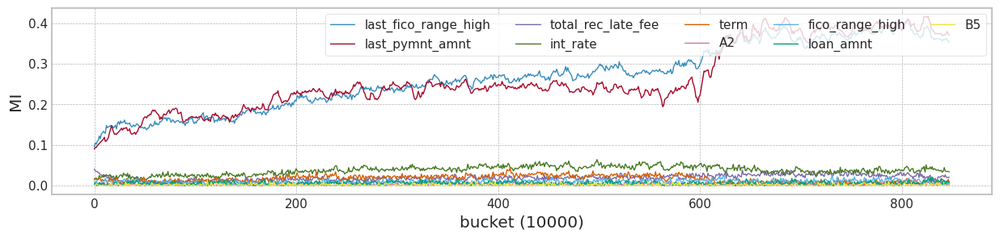

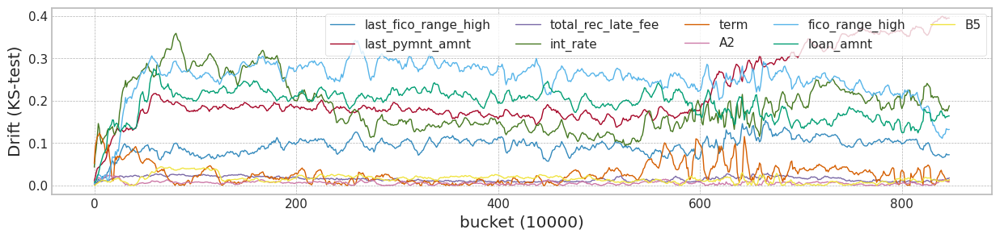

In [88]:
train_size = 10000
test_size = 1497

X1,Y1 = check_mi_drift(X2, Y2, train_size, test_size)

In [89]:
X1['b'] = [int(b/5000) for b in X1.index.values]
X1

,last_fico_range_high,last_pymnt_amnt,total_rec_late_fee,int_rate,term,A2,fico_range_high,loan_amnt,B5,b
0,0.928910,0.032896,0.000000,0.502466,0.0,0.0,0.12500,0.458333,0.0,0
1,0.863744,0.010440,0.000000,0.416769,0.0,0.0,0.62500,0.270833,0.0,0
2,0.727488,0.381296,0.000000,0.566584,0.0,0.0,0.31250,0.375000,0.0,0
3,0.869668,0.021731,0.000000,0.652281,0.0,0.0,0.00000,0.583333,0.0,0
4,0.952607,0.027513,0.000000,0.395191,0.0,0.0,0.59375,0.791667,0.0,0
...,...,...,...,...,...,...,...,...,...,...
1279675,0.917062,0.000269,0.090128,0.278052,0.0,0.0,0.25000,0.158333,0.0,255
1279676,0.857820,0.403841,0.000000,0.278052,0.0,0.0,0.46875,0.583333,0.0,255
1279677,0.905213,0.334665,0.000000,0.157213,0.0,0.0,0.28125,0.358333,0.0,255
1279678,0.922986,0.971979,0.000000,-0.006165,0.0,0.0,0.71875,1.291667,0.0,255


In [ ]:
a = np.asarray([1,2,3,4,5,6])
a[:-1]

array([1, 2, 3, 4, 5])

lambda_f2 1.0
######################### Lambda -0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 618.66it/s]


ty torch.Size([10000])
y_hat (10000, 1)
Test f1 score: 0.9303668841587335
X_live.shape (1278183, 10)
Truncate 28665 rows from live_set (1278183, 10)
Search MI & Drift...for X_live_set torch.Size([848, 10000, 10])


100%|██████████| 848/848 [05:19<00:00,  2.65it/s]


mean of drift:
last_fico_range_high    0.117682
last_pymnt_amnt         0.214501
total_rec_late_fee      0.019389
int_rate                0.187503
term                    0.028391
A2                      0.006191
fico_range_high         0.250177
loan_amnt               0.264611
B5                      0.015895
dtype: float64
Mean F1 for all data: 0.8879347926553869
######################### Lambda 0.0 ###########################
cuda:0


100%|██████████| 4000/4000 [00:25<00:00, 155.45it/s]


ty torch.Size([10000])
y_hat (10000, 1)
Test f1 score: 0.9303668841587335
X_live.shape (1278183, 10)
Truncate 28665 rows from live_set (1278183, 10)
Search MI & Drift...for X_live_set torch.Size([848, 10000, 10])


100%|██████████| 848/848 [05:08<00:00,  2.74it/s]


mean of drift:
last_fico_range_high    1.000000
last_pymnt_amnt         0.987176
total_rec_late_fee      0.983970
int_rate                0.993545
term                    0.745600
A2                      1.000000
fico_range_high         0.715963
loan_amnt               0.359508
B5                      0.924500
dtype: float64
Mean F1 for all data: 0.8879347926553869
######################### Lambda 0.1 ###########################
cuda:0


100%|██████████| 4000/4000 [00:25<00:00, 157.51it/s]


ty torch.Size([10000])
y_hat (10000, 1)
Test f1 score: 0.9437378505970564
X_live.shape (1278183, 10)
Truncate 28665 rows from live_set (1278183, 10)
Search MI & Drift...for X_live_set torch.Size([848, 10000, 10])


100%|██████████| 848/848 [05:07<00:00,  2.76it/s]


mean of drift:
last_fico_range_high    0.883502
last_pymnt_amnt         0.491538
total_rec_late_fee      0.988792
int_rate                0.645381
term                    0.757623
A2                      0.973700
fico_range_high         0.841857
loan_amnt               0.767458
B5                      0.924500
dtype: float64
Mean F1 for all data: 0.888851434204714
######################### Lambda 0.2 ###########################
cuda:0


100%|██████████| 4000/4000 [00:24<00:00, 165.94it/s]


ty torch.Size([10000])
y_hat (10000, 1)
Test f1 score: 0.9420441411194892
X_live.shape (1278183, 10)
Truncate 28665 rows from live_set (1278183, 10)
Search MI & Drift...for X_live_set torch.Size([848, 10000, 10])


100%|██████████| 848/848 [05:01<00:00,  2.81it/s]


mean of drift:
last_fico_range_high    0.709418
last_pymnt_amnt         0.685134
total_rec_late_fee      0.993570
int_rate                0.290313
term                    0.757623
A2                      0.973700
fico_range_high         0.762477
loan_amnt               0.545767
B5                      0.924500
dtype: float64
Mean F1 for all data: 0.8885545682975708
######################### Lambda 0.3 ###########################
cuda:0


100%|██████████| 4000/4000 [00:25<00:00, 156.55it/s]


ty torch.Size([10000])
y_hat (10000, 1)
Test f1 score: 0.9411055055933318
X_live.shape (1278183, 10)
Truncate 28665 rows from live_set (1278183, 10)
Search MI & Drift...for X_live_set torch.Size([848, 10000, 10])


100%|██████████| 848/848 [05:09<00:00,  2.74it/s]


mean of drift:
last_fico_range_high    0.655413
last_pymnt_amnt         0.517572
total_rec_late_fee      0.991849
int_rate                0.226485
term                    0.757623
A2                      0.973700
fico_range_high         0.669054
loan_amnt               0.374224
B5                      0.924500
dtype: float64
Mean F1 for all data: 0.8885707001671479
######################### Lambda 0.4 ###########################
cuda:0


100%|██████████| 4000/4000 [00:25<00:00, 159.17it/s]


ty torch.Size([10000])
y_hat (10000, 1)
Test f1 score: 0.9389134107133126
X_live.shape (1278183, 10)
Truncate 28665 rows from live_set (1278183, 10)
Search MI & Drift...for X_live_set torch.Size([848, 10000, 10])


100%|██████████| 848/848 [05:10<00:00,  2.73it/s]


mean of drift:
last_fico_range_high    0.650282
last_pymnt_amnt         0.729494
total_rec_late_fee      0.992924
int_rate                0.277443
term                    0.757623
A2                      0.973700
fico_range_high         0.623458
loan_amnt               0.233818
B5                      0.923993
dtype: float64
Mean F1 for all data: 0.8882859174644019
######################### Lambda 0.5 ###########################
cuda:0


100%|██████████| 4000/4000 [00:25<00:00, 158.74it/s]


ty torch.Size([10000])
y_hat (10000, 1)
Test f1 score: 0.936285683273635
X_live.shape (1278183, 10)
Truncate 28665 rows from live_set (1278183, 10)
Search MI & Drift...for X_live_set torch.Size([848, 10000, 10])


100%|██████████| 848/848 [05:10<00:00,  2.73it/s]


mean of drift:
last_fico_range_high    0.599018
last_pymnt_amnt         0.774558
total_rec_late_fee      0.992115
int_rate                0.364268
term                    0.757623
A2                      0.973700
fico_range_high         0.578753
loan_amnt               0.189390
B5                      0.922410
dtype: float64
Mean F1 for all data: 0.8882699037184265
######################### Lambda 0.6 ###########################
cuda:0


100%|██████████| 4000/4000 [00:25<00:00, 157.76it/s]


ty torch.Size([10000])
y_hat (10000, 1)
Test f1 score: 0.9334768568353069
X_live.shape (1278183, 10)
Truncate 28665 rows from live_set (1278183, 10)
Search MI & Drift...for X_live_set torch.Size([848, 10000, 10])


100%|██████████| 848/848 [05:13<00:00,  2.70it/s]


mean of drift:
last_fico_range_high    0.372413
last_pymnt_amnt         0.708672
total_rec_late_fee      0.990452
int_rate                0.326314
term                    0.757623
A2                      0.973006
fico_range_high         0.535355
loan_amnt               0.149924
B5                      0.924500
dtype: float64
Mean F1 for all data: 0.8881678051967252
######################### Lambda 0.7 ###########################
cuda:0


100%|██████████| 4000/4000 [00:25<00:00, 158.96it/s]


ty torch.Size([10000])
y_hat (10000, 1)
Test f1 score: 0.9319804584742578
X_live.shape (1278183, 10)
Truncate 28665 rows from live_set (1278183, 10)
Search MI & Drift...for X_live_set torch.Size([848, 10000, 10])


100%|██████████| 848/848 [05:10<00:00,  2.73it/s]


mean of drift:
last_fico_range_high    0.547188
last_pymnt_amnt         0.729162
total_rec_late_fee      0.988981
int_rate                0.269214
term                    0.757623
A2                      0.973006
fico_range_high         0.484924
loan_amnt               0.144087
B5                      0.924500
dtype: float64
Mean F1 for all data: 0.8881305297767764
######################### Lambda 0.8 ###########################
cuda:0


100%|██████████| 4000/4000 [00:25<00:00, 159.64it/s]


ty torch.Size([10000])
y_hat (10000, 1)
Test f1 score: 0.9312821612349914
X_live.shape (1278183, 10)
Truncate 28665 rows from live_set (1278183, 10)
Search MI & Drift...for X_live_set torch.Size([848, 10000, 10])


100%|██████████| 848/848 [05:10<00:00,  2.73it/s]


mean of drift:
last_fico_range_high    0.645779
last_pymnt_amnt         0.741717
total_rec_late_fee      0.991002
int_rate                0.209768
term                    0.757623
A2                      0.973006
fico_range_high         0.421104
loan_amnt               0.152420
B5                      0.924500
dtype: float64
Mean F1 for all data: 0.9164065540891266
######################### Lambda 0.9 ###########################
cuda:0


100%|██████████| 4000/4000 [00:25<00:00, 156.47it/s]


ty torch.Size([10000])
y_hat (10000, 1)
Test f1 score: 0.9306633827702522
X_live.shape (1278183, 10)
Truncate 28665 rows from live_set (1278183, 10)
Search MI & Drift...for X_live_set torch.Size([848, 10000, 10])


100%|██████████| 848/848 [05:16<00:00,  2.68it/s]


mean of drift:
last_fico_range_high    0.259219
last_pymnt_amnt         0.702122
total_rec_late_fee      0.950767
int_rate                0.171721
term                    0.757623
A2                      0.973006
fico_range_high         0.337276
loan_amnt               0.162022
B5                      0.924500
dtype: float64
Mean F1 for all data: 0.888399447649548


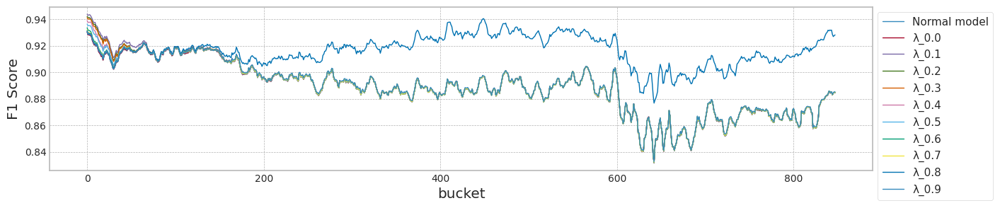

max_mean_lambda= 0.8


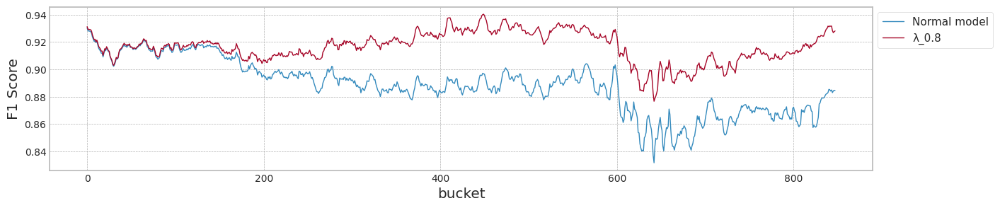

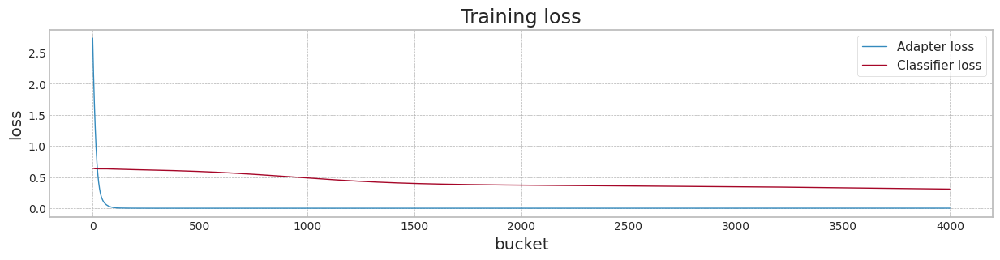

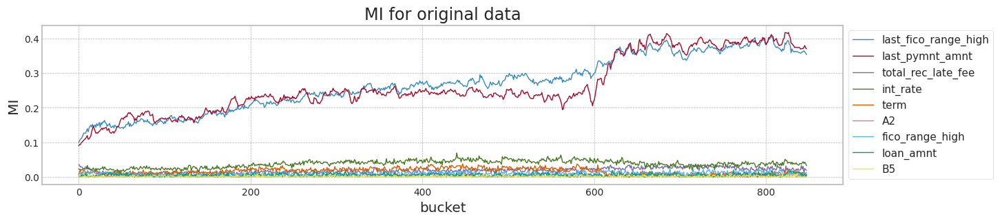

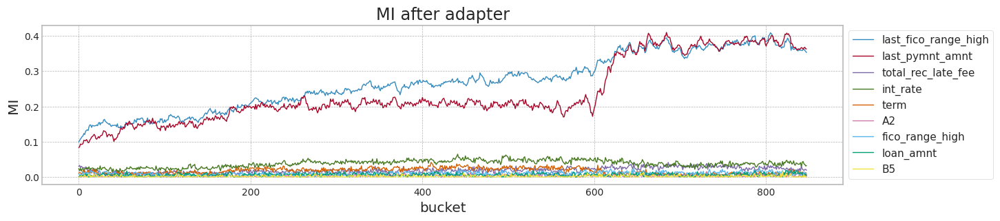

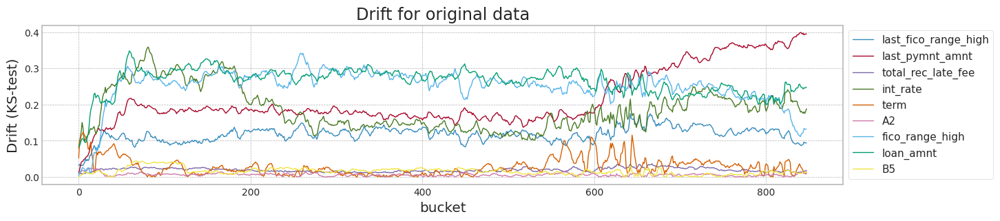

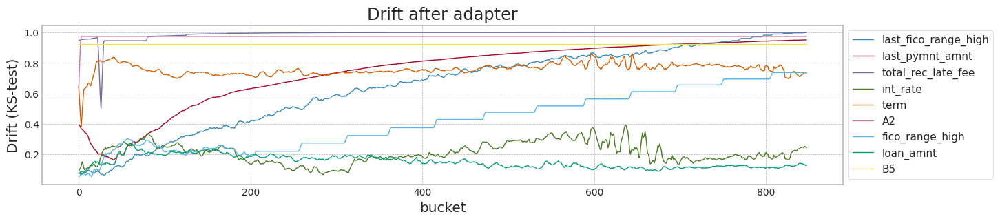

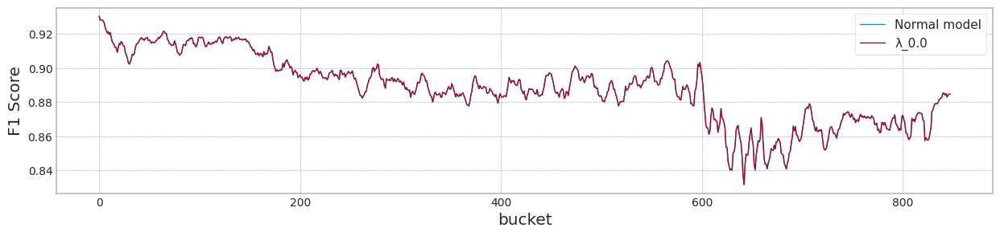

,lambda,test_f1,init_f1,mean_f1,last_f1,sum mi,std mi,sum * std,sum 1/2,std 1/2,sum 2/2,std 2/2,sum 1-2,std 1-2,sum 1+2,std 1+2
0,"Case #1, Normal model",0.930367,0.930367,0.887935,0.884675,0.000750,0.000186,1.391941e-07,0.000200,0.000042,0.000400,0.000126,2.000000e-04,0.000084,0.000600,0.000167
1,0.0,0.930367,0.930367,0.887935,0.884675,0.003450,0.000418,1.443239e-06,0.002400,0.000313,0.002400,0.000330,5.551115e-16,0.000017,0.004800,0.000643
2,0.1,0.943738,0.943738,0.888851,0.884725,0.253869,0.032441,8.235876e-03,0.229723,0.028657,0.268405,0.036494,3.868189e-02,0.007837,0.498128,0.065151
3,0.2,0.942044,0.942044,0.888555,0.884725,0.220761,0.025409,5.609342e-03,0.202568,0.023012,0.231593,0.028196,2.902421e-02,0.005184,0.434161,0.051208
4,0.3,0.941106,0.941106,0.888571,0.884774,0.199549,0.022780,4.545674e-03,0.184963,0.020431,0.211435,0.024408,2.647189e-02,0.003978,0.396399,0.044839
5,0.4,0.938913,0.938913,0.888286,0.884725,0.170198,0.017632,3.000917e-03,0.151391,0.016235,0.187086,0.018566,3.569443e-02,0.002331,0.338477,0.034801
6,0.5,0.936286,0.936286,0.888270,0.884725,0.144587,0.014209,2.054404e-03,0.132326,0.012880,0.157437,0.014502,2.511100e-02,0.001623,0.289763,0.027382
7,0.6,0.933477,0.933477,0.888168,0.884774,0.075612,0.008321,6.291360e-04,0.071384,0.006932,0.079883,0.010038,8.499086e-03,0.003106,0.151268,0.016970
8,0.7,0.931980,0.931980,0.888131,0.884774,0.045905,0.006504,2.985496e-04,0.050549,0.006117,0.047352,0.007447,3.197058e-03,0.001330,0.097901,0.013564
9,0.8,0.931282,0.931282,0.916407,0.928139,0.032687,0.004455,1.456055e-04,0.038855,0.004306,0.031117,0.004384,7.738024e-03,0.000077,0.069972,0.008690


In [90]:
drift_tolerant(X1, Y1,train_size, test_size,avaible_range = np.max(X1['b'])+1)

### Card data 실험

#### Dataset 준비

In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 66 bytes


In [ ]:
!kaggle datasets download "ealtman2019/credit-card-transactions"

 95% 249M/263M [00:02<00:00, 105MB/s]
100% 263M/263M [00:02<00:00, 112MB/s]


In [ ]:
!unzip credit-card-transactions.zip

Archive:  credit-card-transactions.zip
  inflating: User0_credit_card_transactions.csv  
  inflating: credit_card_transactions-ibm_v2.csv  
  inflating: sd254_cards.csv         
  inflating: sd254_users.csv         


In [ ]:
df = pd.read_csv("credit_card_transactions-ibm_v2.csv")

In [ ]:
df['Year'].value_counts()

2019    1723938
2017    1723360
2018    1721615
2016    1708924
2015    1701371
2014    1672343
2013    1650917
2012    1610829
2011    1570551
2010    1491225
2009    1355434
2008    1223460
2007    1064483
2006     908793
2005     746653
2004     597003
2003     466408
2002     350732
2020     336500
2001     257998
2000     177729
1999     118250
1998      78345
1997      49753
1996      29945
1995      20928
1994      14316
1993       8378
1992       5134
1991       1585
Name: Year, dtype: int64

In [ ]:
import lightgbm as lgb
from sklearn.metrics import classification_report
df['Is Fraud?']=df['Is Fraud?'].replace({'No':0,'Yes':1})
df1 = df[df['Is Fraud?']==1]
df2 = df[df['Is Fraud?']==0]
df3 = df2.sample(int(df2.shape[0]/30))
df4 = pd.concat([df1,df3])

print("Compression rate:",df4.shape[0] / df.shape[0] )

df = df4

Compression rate: 0.034512832709364456


In [ ]:
df['Errors?']=df['Errors?'].fillna('NAN')
df['Errors?']=df['Errors?'].apply(lambda value:value=='NAN')
df['Errors?'].value_counts()

df['Use Chip'].unique()
df['is online']=df['Use Chip'].apply(lambda value:value=='Online Transaction')

from sklearn.preprocessing import LabelEncoder
df['Use Chip']=df['Use Chip'].replace({'Swipe Transaction':0, 'Online Transaction':1, 'Chip Transaction':2})
df['Zip'] = df['Zip'].fillna(df['Zip'].mean())
df['Amount'] = df['Amount'].apply(lambda value: float(value.split("$")[1]))
df['Hour'] = df['Time'].apply(lambda value: int(value.split(":")[0]))
df['Minutes'] = df['Time'].apply(lambda value: int(value.split(":")[1]))
df.drop(['Time'], axis=1, inplace=True)
df['Merchant State']=df['Merchant State'].fillna('NAN')
df['Merchant City']=df['Merchant City'].fillna('NAN')
df['is vozmes']=df['Amount'].apply(lambda value: value<0)
df['abs_amount']=df['Amount'].apply(lambda value: abs(value))

#encoding categorial features
le=LabelEncoder()
df['Merchant State']=le.fit_transform(df['Merchant State'])
le=LabelEncoder()
df['Merchant City']=le.fit_transform(df['Merchant City'])
le=LabelEncoder()
df['Errors?']=le.fit_transform(df['Errors?'])
le=LabelEncoder()
df['is online']=le.fit_transform(df['is online'])
le=LabelEncoder()
df['is vozmes']=le.fit_transform(df['is vozmes'])

df = df.sort_values(['Year','Month','Day'])

df.Year.value_counts()

2016    60412
2015    60116
2018    59563
2019    59488
2017    57276
2013    57029
2014    56782
2012    54838
2010    53127
2011    52594
2009    46612
2008    44566
2007    37404
2006    31560
2005    25216
2004    20436
2003    15753
2002    11773
2020    11251
2001     8820
2000     6049
1999     3969
1998     2689
1997     1641
1996      968
1995      691
1994      511
1993      276
1992      185
1991       66
Name: Year, dtype: int64

In [ ]:
drop_columns = ['Is Fraud?','Zip','Year','Month','Day','Minutes','User','Errors?','Merchant Name','Merchant City','Merchant State']
X = df[(df['Year']==2005) |(df['Year']==2006) | (df['Year']==2007) | (df['Year']==2008) | (df['Year']==2009)].drop(drop_columns,axis=1)
y = df[(df['Year']==2005) |(df['Year']==2006) | (df['Year']==2007) | (df['Year']==2008) | (df['Year']==2009)]['Is Fraud?']
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 185358 entries, 17325692 to 342823
Data columns (total 8 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Card        185358 non-null  int64  
 1   Amount      185358 non-null  float64
 2   Use Chip    185358 non-null  int64  
 3   MCC         185358 non-null  int64  
 4   is online   185358 non-null  int64  
 5   Hour        185358 non-null  int64  
 6   is vozmes   185358 non-null  int64  
 7   abs_amount  185358 non-null  float64
dtypes: float64(2), int64(6)
memory usage: 12.7 MB


In [ ]:
np.sum(y[0:30000])

536

#### 실험

MI Analysis MI Max 0.04861, Min 0.00078, Mean 0.01996, Std 0.01460
Dataset structure X_train, (30000, 8) X_test, (30000, 8) X_live (182358, 8)
Truncate 156222 rows from live_set (182358, 8)
Search MI & Drift...for X_live_set (51, 30000, 8)


100%|██████████| 51/51 [00:54<00:00,  1.06s/it]


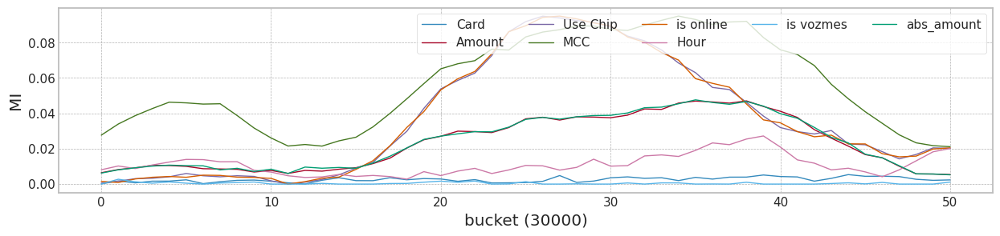

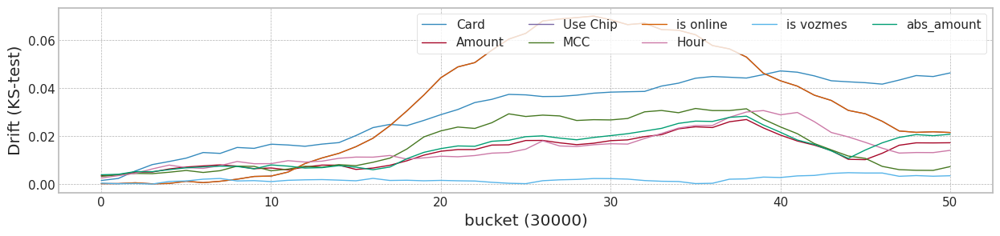

In [ ]:

train_size = 30000
test_size = 3000

X1,Y1 = check_mi_drift(X, y.values,train_size, test_size)

MI Analysis MI Max 0.02838, Min 0.00038, Mean 0.00683, Std 0.00866
cuda:0


100%|██████████| 1000/1000 [06:21<00:00,  2.62it/s]

MSE: 0.10
RMSE: 0.32


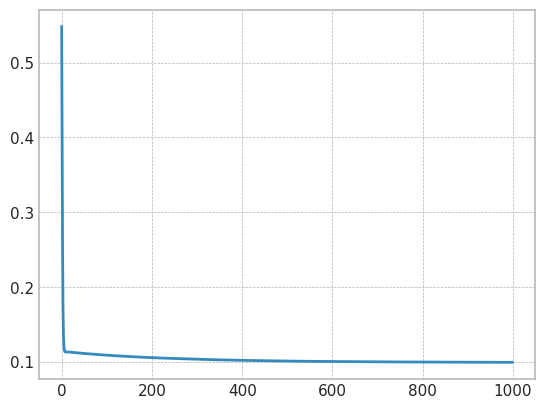

F1 Score:0.00000
Dataset structure X_train, torch.Size([30000, 8]) X_test, torch.Size([30000, 8]) X_live (182358, 8)
Truncate 156222 rows from live_set (182358, 8)


100%|██████████| 51/51 [00:00<00:00, 96.38it/s]


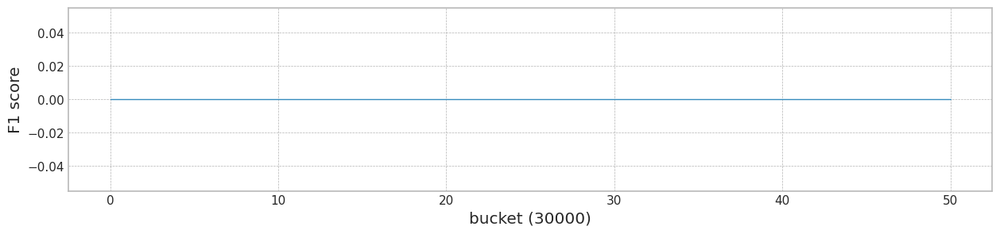

   test_f1  init_f1  mean_f1  last_f1   SUM(MI)
0      0.0      0.0      0.0      0.0  0.054619


In [ ]:
model,df = train_classificaion_model(X1,Y1,train_size, test_size)